In [1]:
import pandas as pd
import geopandas as gpd
from REM.datasources import *

# 1. Consultar atributos SMP en área de estudio 

In [2]:
mascara = thiner_bound(path='../data/BarOli_V1/layers/P_BP_AREA_5347.shp')
parcelas = caba_parcelas(source_idx=1)
parcelas_sur = build_study_area(parcelas, mascara)

Reading parcels from local dir ...


/home/federico/federico/CEEU/bolimpico/REM/REM/datasources.py:92: UserWarning: Los sistemas de coordenadas difieren. Adaptando mascara a CRS de parcelas
  warnings.warn("Los sistemas de coordenadas difieren. Adaptando mascara a CRS de parcelas")


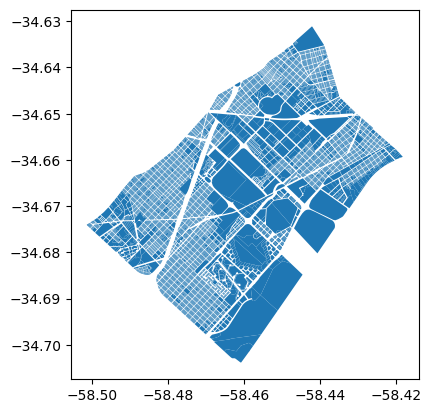

In [3]:
parcelas_sur.plot();

In [4]:
len(parcelas_sur.smp.unique()) # parcelas a consultar en endpoint

28069

# 2. Realización de consulta por parcela

En esta instancia se consultan los atributos de la parcela disponibles en el endpoint asignado a `API_BASE`.

In [5]:
API_BASE = ['https://epok.buenosaires.gob.ar/catastro/parcela?smp={}']

In [6]:
import requests
import logging
import time

In [7]:
def get_endpoint(url):
    '''
    Devuelve dict con información por parcela.
    '''
    
    BACKOFF_TIME = 30
    logger = logging.getLogger("root")
    logger.setLevel(logging.DEBUG)

    # console handler
    ch = logging.StreamHandler()
    ch.setLevel(logging.DEBUG)
    logger.addHandler(ch)

    print('Getting data from ', url)
    res = requests.get(url)
    
    print(res.status_code, res.url)
    while res.status_code != 200:
        try:
            print("Limite de consulta. Pausar 30 min")
            time.sleep(BACKOFF_TIME * 60) 
            res = requests.get(url)
            print(res.reason)
        except:
            print("Parcela no encontrada")
            pass

    return res

In [8]:
# urls de consulta
smp_parcelas = parcelas_sur.smp.unique()

all_urls = []
for smp in smp_parcelas:
    all_urls.append(API_BASE[0].format(smp))

In [9]:
len(all_urls)

28069

In [10]:
all_parcels = []
for url in all_urls[:5]: # Probar primeras 3
    all_parcels.append(get_endpoint(url))

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-026 HTTP/1.1" 200 1036
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-026
200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-026
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-001


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-001 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-001 HTTP/1.1" 200 698
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-019 HTTP/1.1" 301 0


200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-001
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150A-019


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150A-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150A-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150A-019 HTTP/1.1" 200 691
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-022 HTTP/1.1" 301 0


200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150A-019
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-022


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-022 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-022 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-022 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-022 HTTP/1.1" 200 691
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-022
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-002
200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-002


In [11]:
all_parcels[2].reason

'OK'

In [12]:
# Ejemplo
all_parcels[2].json()

{'direccion': 'CABALLITO 1479',
 'smp': '044-150A-019',
 'seccion': '044',
 'manzana': '150A',
 'parcela': '019',
 'centroide': [-58.43941082688349, -34.636860123319266],
 'srid': 4326,
 'smp_anterior': '044-150A-018',
 'smp_siguiente': '044-150A-020',
 'pdamatriz': '46747',
 'superficie_total': '162.00',
 'superficie_cubierta': '145.00',
 'frente': '8.63',
 'fondo': '18.77',
 'propiedad_horizontal': 'Si',
 'pisos_bajo_rasante': '0',
 'pisos_sobre_rasante': '1',
 'unidades_funcionales': '2',
 'locales': '0',
 'vuc': '0.00',
 'fuente': 'AGIP (2008)',
 'cantidad_puertas': 1,
 'puertas': [{'calle': 'CABALLITO',
   'altura': 1479,
   'codigo_calle': 3002,
   'puerta_principal': True,
   'puerta_oficial': True,
   'fuente': 'DGROC Junio 2019',
   'fecha_actualizacion': '27/11/2019'}]}

# 3. Consulta masiva

In [13]:
from multiprocessing import Pool

In [ ]:
p = Pool(2)
res = p.map(get_endpoint, all_urls[:1000]) # Se recomienda consultar de a mil
p.terminate()
p.join()

Getting data from Getting data from   https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-022https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-026



Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-022 HTTP/1.1" 200 1060
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-022 HTTP/1.1" 200 1060


 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-026
200Getting data from   https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-022https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-001

Getting data from  

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-006o

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

200 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006o HTTP/1.1" 200 882


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-001

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006o HTTP/1.1" 200 882


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006o HTTP/1.1" 200 882


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006o HTTP/1.1" 200 882


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006o HTTP/1.1" 200 882


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150A-019

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006o HTTP/1.1" 200 882


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006o HTTP/1.1" 200 882
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-006o

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-023


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-023200
 Getting data from https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150A-019 
https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-133-006aGetting data from 
 https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-022

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-006a HTTP/1.1" 200 1010


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-006a HTTP/1.1" 200 1010


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-022

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-006a HTTP/1.1" 200 1010


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-006a HTTP/1.1" 200 1010


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-006a HTTP/1.1" 200 1010


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-006a HTTP/1.1" 200 1010


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-002

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-006a HTTP/1.1" 200 1010


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-006a HTTP/1.1" 200 1010
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-006a HTTP/1.1" 200 1010
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-133-006a

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-133-033

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp

200200  https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-133-033https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-002

Getting data from Getting data from   https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-004bhttps://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-021



Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-021
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150A-020


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-004b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-004b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-004b
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-133-005

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-020 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-020 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-020 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-020 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-020 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150A-020
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-003


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-005 HTTP/1.1" 301 0

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-133-005
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-003


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-003 HTTP/1.1" 301

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-003
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-020


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-003 HTTP/1.1" 301 0
https://epok.buenosaires.go

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-003
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-133-034


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-020 HTTP/1.1" 301 0
https://epok.buenosaires.g

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-020
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150A-021


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-133-034
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-020a


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-021 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-021 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-021 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-021 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-021 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-021 HTTP/1.1" 301 0
Startin

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150A-021
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-004


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-020a
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-133-004


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-004
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-019


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-133-004
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-002


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-019
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150A-022


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-022 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-022 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-002

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-022 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-022 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-022 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-022 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-133-003

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-022 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-022 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connect

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150A-022
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-005a


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-005a HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-005a HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-133-003

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-005a HTTP/1.1" 301 0



Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-133-035


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-005a
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-018


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-018 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-018 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-133-035

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-018 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-018 HTTP/1.1" 301 0


Getting data from  

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-018 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-133-002

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-018 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-018 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-018
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150A-023


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-133-002
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-133-001


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150A-023
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-005b


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-133-001
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-042


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-005b
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-017b


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-042
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-001


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-017b
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-017a


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-001
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-043


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-017a
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-006


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-043 HTTP/1.1" 200 846


200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-043
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-044


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-006
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-016


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-044 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-044 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-044 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-044 HTTP/1.1" 200 683


200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-044
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-032


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-016
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-007


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-032 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-032 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-032 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-032 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-032 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-032 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-032 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-032 HTTP/1.1" 200 868


200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-032
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-039a


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-007
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-014


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-039a HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-039a HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-039a HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-039a HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-039a HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-039a HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-039a HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-039a HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-039a HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-039a HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-039a
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-038


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-014 HTTP/1.1" 200 857
Starting new HTTPS conn

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-014
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-015


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-015 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-038 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-015 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-015 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-038 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-015 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-038 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-015 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-038 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-015 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/par

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-015 HTTP/1.1" 200 691


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-015 HTTP/1.1" 200 691


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-038

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-015 HTTP/1.1" 200 691


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-015 HTTP/1.1" 200 691


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-015 HTTP/1.1" 200 691


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-015 HTTP/1.1" 200 691


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-037

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-015 HTTP/1.1" 200 691



200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-015

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-013

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-037 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-037 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-013 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-037 HTTP/1.1" 200 1009
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-013 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-037 HTTP/1.1" 200 1009
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-013 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044

200200  https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-013https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-037

Getting data from Getting data from   https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-012https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-033



Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-012 HTTP/1

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-012 HTTP/1.1" 200 857


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-012 HTTP/1.1" 200 857


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-033
Getting data from  200https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-134-025 
https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-012
Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-011

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-011 HTTP/1.

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-011 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-011 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-011 HTTP/1.1" 200 691


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-011 HTTP/1.1" 200 691


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-134-025

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-011 HTTP/1.1" 200 691


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-011 HTTP/1.1" 200 691


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-011 HTTP/1.1" 200 691


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-011 HTTP/1.1" 200 691


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-036

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-011 HTTP/1.1" 200 691



200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-011

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-008

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-008 HTTP

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-008 HTTP/1.1" 200 869


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-008 HTTP/1.1" 200 869


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-036

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-008 HTTP/1.1" 200 869


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-008 HTTP/1.1" 200 869


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-008 HTTP/1.1" 200 869


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-008 HTTP/1.1" 200 869


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-134-026

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-008 HTTP/1.1" 200 869


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-008 HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-008 HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-008 HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-008 HTTP/1.1" 200 869
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-008 HTTP/1.1" 200 869
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-008 HTTP/1.1" 200 869
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-008 HTTP/1.1" 200 869
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosa

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-008

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-010

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-026 HTTP/1.1" 200 681
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-026 HTTP/1.1" 200 681
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-026 HTTP/1.1" 200 681
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-026 H

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-010 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-010 HTTP/1.1" 200 691


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-010 HTTP/1.1" 200 691


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-134-026

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-010 HTTP/1.1" 200 691


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-010 HTTP/1.1" 200 691


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-010 HTTP/1.1" 200 691


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-010 HTTP/1.1" 200 691


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-134-028

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-010 HTTP/1.1" 200 691



200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-010


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-009

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-028 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-028 HTTP/1.1" 200 682
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-028 HTTP/1.1" 200 682
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-028 HTTP/1.1" 200 682


200 200https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-009 
https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-134-028Getting data from 
 Getting data from https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-151-014 
https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-134-027


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-014 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-027 HTTP/1.1" 200 681
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-151-014 HTTP/1.1" 200 507
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-027 HTTP/1.1" 200 681
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-151-014 HTTP/1.1" 200 507
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-027 HTTP/1.1" 200 681
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-151-014 HTTP/1.1" 200 507
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-027 HTTP/1.1" 200 681
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-151-014 HTTP/1.1" 200 507
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-027 HTTP/1.1" 200 681
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-151-014 HTTP/1.1" 200 507
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

200200  https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-151-014https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-134-027

Getting data from Getting data from   https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-151-015https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-134-001



Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-001 HTTP/1.1" 301 0

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-001 HTTP/1.1" 200 864


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-001 HTTP/1.1" 200 864


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-151-015

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-001 HTTP/1.1" 200 864


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-001 HTTP/1.1" 200 864
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-001 HTTP/1.1" 200 864


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-001 HTTP/1.1" 200 864


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-001 HTTP/1.1" 200 864


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-151-016

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-001 HTTP/1.1" 200 864


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-001 HTTP/1.1" 200 864
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-001 HTTP/1.1" 200 864
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-001 HTTP/1.1" 200 864
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-001 HTTP/1.1" 200 864
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-001 HTTP/1.1" 200 864
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-001 HTTP/1.1" 200 864
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-001 HTTP/1.1" 200 864
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.go

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-134-001

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-035

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-035 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-151-016 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-151-016 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-151-016 HTTP/1.1" 200 687


200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-151-016 HTTP/1.1" 200 687


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-151-016 HTTP/1.1" 200 687


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-035
Getting data from  200https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-034 
https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-151-016
Getting data from  

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-151-020

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-020 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-151-020 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-034 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-151-020 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-034 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-151-020 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-034 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-151-020 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-034 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-151-020 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-034 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

200 200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-034https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-151-020

Getting data from  Getting data from https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147B-023 
https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-151-019


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-151-019 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-023 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-151-019 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-023 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-151-019 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-023 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-151-019 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-023 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-151-019 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-023 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-151-019 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-023 HTTP/1.1" 200 684


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-023 HTTP/1.1" 200 684


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-151-019

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-023 HTTP/1.1" 200 684


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-023 HTTP/1.1" 200 684


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-023 HTTP/1.1" 200 684


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-023 HTTP/1.1" 200 684


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-151-017

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-023 HTTP/1.1" 200 684


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-023 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-023 HTTP/1.1" 200 684
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-023 HTTP/1.1" 200 684
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-023 HTTP/1.1" 200 684
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-023 HTTP/1.1" 200 684
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147B-023

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-134-002

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-002 HTTP/1.1" 301 0

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-002 HTTP/1.1" 200 874


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-002 HTTP/1.1" 200 874


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-151-017

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-002 HTTP/1.1" 200 874


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-002 HTTP/1.1" 200 874


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-002 HTTP/1.1" 200 874


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-002 HTTP/1.1" 200 874


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-006n

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-002 HTTP/1.1" 200 874


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-002 HTTP/1.1" 200 874
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-002 HTTP/1.1" 200 874
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-002 HTTP/1.1" 200 874
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-002 HTTP/1.1" 200 874
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-002 HTTP/1.1" 200 874
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-002 HTTP/1.1" 200 874
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-002 HTTP/1.1" 200 874
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-002 HTTP/1.1" 200 874
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-134-002

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147B-024

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006n HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006n HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006n HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006n HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006n HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006n HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006n HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006n HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006n HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006n HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006n HTTP/1.1" 200 710


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006n HTTP/1.1" 200 710


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147B-024

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006n HTTP/1.1" 200 710


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006n HTTP/1.1" 200 710


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006n HTTP/1.1" 200 710


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006n HTTP/1.1" 200 710


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147B-022

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006n HTTP/1.1" 200 710


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006n HTTP/1.1" 200 710
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006n HTTP/1.1" 200 710
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006n HTTP/1.1" 200 710
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006n HTTP/1.1" 200 710
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006n HTTP/1.1" 200 710
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006n HTTP/1.1" 200 710
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006n HTTP/1.1" 200 710
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006

200 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-006n

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-006s

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006s HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006s HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006s HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006s HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006s HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-022 HTTP/1.1" 200 880
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006s HTTP/1.1" 200 1065
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-022 HTTP/1.1" 200 880
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006s HTTP/1.1" 200 1065
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-022 HTTP/1.1" 200 880
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006s HTTP/1.1" 200 1065
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-022 HTTP/1.1" 200 880
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006s HTTP/1.1" 200 1065
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-022 HTTP/1.1" 200 880
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006s HTTP/1.1" 200 1065
https://epok.buenosaires.gob.ar:443 "GET

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006s HTTP/1.1" 200 1065


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006s HTTP/1.1" 200 1065


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147B-022

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006s HTTP/1.1" 200 1065


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006s HTTP/1.1" 200 1065


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006s HTTP/1.1" 200 1065


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006s HTTP/1.1" 200 1065


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147B-001

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006s HTTP/1.1" 200 1065



200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-006s

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-024

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-001 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-001 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-024 HTTP/1.1" 200 712
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-001 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-001 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-024 HTTP/1.1" 200 712
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-001 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-024 HTTP/1.1" 200 712
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-001 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-024 HTTP/1.1" 200 712
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-001 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-001 HTTP/1.1" 200 851


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-024

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-001 HTTP/1.1" 200 851


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-001 HTTP/1.1" 200 851


Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-025a
200 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147B-001

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147B-026

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-025a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-025a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-025a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-025a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-025a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-026

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-026 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-025a HTTP/1.1" 200 1058
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-026 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-025a HTTP/1.1" 200 1058
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-026 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-026 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-025a HTTP/1.1" 200 1058
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-026 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-025a HTTP/1.1" 200 1058
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-026 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-025a HTTP/1.1" 200 1058


 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147B-026
Getting data from 200  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147B-025ahttps://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-025a

Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-006m

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006m HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-025a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006m HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-025a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006m HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-025a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006m HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-025a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006m HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-025a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006m HTTP/1.1" 200 1229
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-025a HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006m HTTP/1.1" 200 1229
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-025a HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006m HTTP/1.1" 200 1229
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-025a HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006m HTTP/1.1" 200 1229
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-025a HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-025a HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006m HTTP/1.1" 200 1229
https://epok.buenosaires.gob.ar:443

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006m HTTP/1.1" 200 1229


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006m HTTP/1.1" 200 1229


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147B-025a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006m HTTP/1.1" 200 1229


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006m HTTP/1.1" 200 1229


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006m HTTP/1.1" 200 1229


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006m HTTP/1.1" 200 1229


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-134-003

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006m HTTP/1.1" 200 1229


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006m HTTP/1.1" 200 1229
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006m HTTP/1.1" 200 1229
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006m HTTP/1.1" 200 1229
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-006m

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-025b

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-025b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-025b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-025b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-025b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-025b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-003 HTTP/

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-003 HTTP/1.1" 200 702
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-025b HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-003 HTTP/1.1" 200 702
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-025b HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-003 HTTP/1.1" 200 702
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-025b HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-003 HTTP/1.1" 200 702
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-025b HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-003 HTTP/1.1" 200 702
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-025b HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-003 HTTP/1.1" 200 702


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-003 HTTP/1.1" 200 702


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-025b

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-003 HTTP/1.1" 200 702


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-003 HTTP/1.1" 200 702


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-003 HTTP/1.1" 200 702


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-003 HTTP/1.1" 200 702


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-026


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-134-003

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147B-021a

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-021a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-021a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-021a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-021a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-021a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-021

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-026 HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-021a HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-026 HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-021a HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-026 HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-021a HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-026 HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-021a HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-026 HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-021a HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /cat

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-026 HTTP/1.1" 200 871


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-026 HTTP/1.1" 200 871


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147B-021a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-026 HTTP/1.1" 200 871


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-026 HTTP/1.1" 200 871


Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147A-025200
 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-026


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-006l

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006l HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006l HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006l HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006l HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006l HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006l HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-02

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-025 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006l HTTP/1.1" 200 1055
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-025 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006l HTTP/1.1" 200 1055
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-025 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006l HTTP/1.1" 200 1055
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-025 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006l HTTP/1.1" 200 1055
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-025 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006l HTTP/1.1" 200 1055
https://epok.buenosaires.gob.ar:443 "GET

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-025 HTTP/1.1" 200 852


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-025 HTTP/1.1" 200 852


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-006l

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-025 HTTP/1.1" 200 852


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-025 HTTP/1.1" 200 852


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-025 HTTP/1.1" 200 852


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-025 HTTP/1.1" 200 852


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-027
200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147A-025

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-134-009

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-009 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-009 HTTP/1.1" 200 880
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-027 HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-009 HTTP/1.1" 200 880
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-027 HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-027 HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-009 HTTP/1.1" 200 880
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-009 HTTP/1.1" 200 880
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-027 HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-009 HTTP/1.1" 200 880
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-027 HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

200200  https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-134-009https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-027

Getting data from Getting data from   https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147B-002https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-006k



Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006k HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006k HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006k HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006k HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006k HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006k HTTP/1.1" 200 710
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-002 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006k HTTP/1.1" 200 710
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-002 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006k HTTP/1.1" 200 710
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-002 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006k HTTP/1.1" 200 710
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-002 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006k HTTP/1.1" 200 710
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-002 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006k HTTP/1.1" 200 710
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-002 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006k HTTP/1.1" 200 710
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-002 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006k HTTP/1.1" 200 710
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006k HTTP/1.1" 200 710
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006k HTTP/1.1" 200 710


200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147B-002200
 Getting data from https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-006k 
https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-134-004Getting data from 
 https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-028


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-004 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-004 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-028 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-004 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-028 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-004 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-028 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-004 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-028 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-004 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-028 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-028 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-004 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-028 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-004 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-028 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-028 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-028 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-028 HTTP/1.1" 200 870


200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-028 HTTP/1.1" 200 870


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-028 HTTP/1.1" 200 870


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-134-004
Getting data from  200https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147A-026 
https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-028


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-006j

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006j HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006j HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006j HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006j HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006j HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006j HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006j HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006j HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006j HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /cata

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006j HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006j HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006j HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006j HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006j HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006j HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006j HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006j HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006j HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET 

200 200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-006jhttps://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147A-026
Getting data from 
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-134-008
 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-006f

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006e HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006e HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006e HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006e HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006e HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-003 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-003 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-003 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-003 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006e HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-003 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006e HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-003 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006e HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-003 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catas

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-003 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006e HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-003 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006e HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-003 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006e HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-003 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006e HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-003 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006e HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /cat

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006e HTTP/1.1" 200 871


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006e HTTP/1.1" 200 871


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147B-003

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006e HTTP/1.1" 200 871


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006e HTTP/1.1" 200 871


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006e HTTP/1.1" 200 871


 https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147B-020
200 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-006e

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-029

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-020 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-020 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-020 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-020 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-029 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-020 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-029 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-020 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-029 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-020 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-029 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-020 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-029 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-020 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-029 HTTP/1.1" 200 870


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-029 HTTP/1.1" 200 870


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147B-020

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-029 HTTP/1.1" 200 870



Getting data from  200https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147A-027 
https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-029
Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-006h

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006h HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006h HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006h HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006h HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006h HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006h HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006h HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006h HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006h HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006h HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-027 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006h HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-027 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006h HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006h HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006h HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006h HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006h HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006h HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006h HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006h HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET 

200 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-027 HTTP/1.1" 200 685


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-006h


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-027 HTTP/1.1" 200 685


Getting data from  

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-027 HTTP/1.1" 200 685


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-006d


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-027 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-027 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.go

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147A-027

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147A-028

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006d HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006d HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006d HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006d HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006d HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006d HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006d HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006d HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006d HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006d HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006d HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006d HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006d HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006d HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006d HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006d HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006d HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006d HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006d HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006d HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-028 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-028 HTTP/1.1" 200 849


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-028 HTTP/1.1" 200 849


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-006d

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-028 HTTP/1.1" 200 849


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-028 HTTP/1.1" 200 849


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-028 HTTP/1.1" 200 849


 https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-006i


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-028 HTTP/1.1" 200 849
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-028 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-028 HTTP/1.1" 200 849
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-028 HTTP/1.1" 200 849
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-028 HTTP/1.1" 200 849
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-028 HTTP/1.1" 200 849
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147A-028
Getting data from  

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147A-001


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006i HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006i HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006i HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006i HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006i HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-001

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006i HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-001 HTTP/1.1" 200 1031
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-001 HTTP/1.1" 200 1031
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-001 HTTP/1.1" 200 1031
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-001 HTTP/1.1" 200 1031
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-001 HTTP/1.1" 200 1031
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-001 HTTP/1.1" 200 1031
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-001 HTTP/1.1" 200 1031
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-001 HTTP/1.1" 200 1031
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-001 HTTP/1.1" 200 1031
https://epok.buenosaires.gob.ar:443 "GET /c

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006i HTTP/1.1" 200 710
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-001 HTTP/1.1" 200 1031
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006i HTTP/1.1" 200 710
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-001 HTTP/1.1" 200 1031
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006i HTTP/1.1" 200 710
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-001 HTTP/1.1" 200 1031
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006i HTTP/1.1" 200 710
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-001 HTTP/1.1" 200 1031
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006i HTTP/1.1" 200 710
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-001 HTTP/1.1" 200 1031
https://epok.buenosaires.gob.ar:443 "GET

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006i HTTP/1.1" 200 710


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006i HTTP/1.1" 200 710


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147A-001

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006i HTTP/1.1" 200 710


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006i HTTP/1.1" 200 710


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006i HTTP/1.1" 200 710


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006i HTTP/1.1" 200 710


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147A-029

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006i HTTP/1.1" 200 710


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006i HTTP/1.1" 200 710
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006i HTTP/1.1" 200 710
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006i HTTP/1.1" 200 710
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006i HTTP/1.1" 200 710
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006i HTTP/1.1" 200 710
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006i HTTP/1.1" 200 710
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-006i

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-006v

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-029 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006v HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006v HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006v HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006v HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006v HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006v HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006v HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006v HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006v HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006v HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-029 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006v HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-029 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006v HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-029 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006v HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-029 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006v HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-029 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006v HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /cat

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006v HTTP/1.1" 200 871


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006v HTTP/1.1" 200 871


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147A-029

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006v HTTP/1.1" 200 871


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006v HTTP/1.1" 200 871


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006v HTTP/1.1" 200 871


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006v HTTP/1.1" 200 871


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-134-005a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006v HTTP/1.1" 200 871


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006v HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006v HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006v HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006v HTTP/1.1" 200 871
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006v HTTP/1.1" 200 871
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006v HTTP/1.1" 200 871
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006v HTTP/1.1" 200 871
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-006v

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-006u

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-005a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006u HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-005a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-005a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006u HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-005a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006u HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-005a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006u HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-005a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006u

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006u HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006u HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006u HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006u HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006u HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006u HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006u HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006u HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006u HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006u HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-13

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-005a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006u HTTP/1.1" 200 873
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-005a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006u HTTP/1.1" 200 873
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-005a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006u HTTP/1.1" 200 873
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-005a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006u HTTP/1.1" 200 873
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-005a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006u HTTP/1.1" 200 873
https://epok.buenosaires.gob.ar:443 "GET /cat

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006u HTTP/1.1" 200 873


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006u HTTP/1.1" 200 873


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-134-005a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006u HTTP/1.1" 200 873


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006u HTTP/1.1" 200 873


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006u HTTP/1.1" 200 873


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006u HTTP/1.1" 200 873


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-134-007a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006u HTTP/1.1" 200 873


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006u HTTP/1.1" 200 873
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006u HTTP/1.1" 200 873
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006u HTTP/1.1" 200 873
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006u HTTP/1.1" 200 873
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006u HTTP/1.1" 200 873
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006u HTTP/1.1" 200 873
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenos

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-006u

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-006r

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-007a HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006r HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006r HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006r HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006r HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006r HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006r HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006r HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006r HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006r HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-006r HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-007a HTTP/1.1" 200 885
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006r HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-007a HTTP/1.1" 200 885
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006r HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-007a HTTP/1.1" 200 885
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006r HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-007a HTTP/1.1" 200 885
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006r HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-007a HTTP/1.1" 200 885
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006r HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /cat

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006r HTTP/1.1" 200 871


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006r HTTP/1.1" 200 871


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-134-007a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006r HTTP/1.1" 200 871


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006r HTTP/1.1" 200 871


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006r HTTP/1.1" 200 871


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006r HTTP/1.1" 200 871


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147B-004

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006r HTTP/1.1" 200 871


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006r HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006r HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006r HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006r HTTP/1.1" 200 871
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006r HTTP/1.1" 200 871
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006r HTTP/1.1" 200 871
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006r HTTP/1.1" 200 871
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-006r HTTP/1.1" 200 871
Starting new HTTPS connection (1): epok.bue

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-006r

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-030

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-019a HTTP/1.1" 200 882
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-019a HTTP/1.1" 200 882
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-019a HTTP/1.1" 200 882
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-019a HTTP/1.1" 200 882
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-019a HTTP/1.1" 200 882
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-019a HTTP/1.1" 200 882
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-019a HTTP/1.1" 200 882
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-019a HTTP/1.1" 200 882
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-019a HTTP/1.1" 200 882
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-019a HTTP/1.1" 200 882
https://epok.buenosaires.gob.ar:443 "GET

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-004 HTTP/1.1" 200 867


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-004 HTTP/1.1" 200 867


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147B-019a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-004 HTTP/1.1" 200 867


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-004 HTTP/1.1" 200 867
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-004 HTTP/1.1" 200 867


Getting data from  

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-004 HTTP/1.1" 200 867


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-134-006a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-004 HTTP/1.1" 200 867


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-004 HTTP/1.1" 200 867
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-004 HTTP/1.1" 200 867
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-004 HTTP/1.1" 200 867
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-004 HTTP/1.1" 200 867
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-004 HTTP/1.1" 200 867
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-004 HTTP/1.1" 200 867
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-004 HTTP/1.1" 200 867
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-004 HTTP/1

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-004 HTTP/1.1" 200 867
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-004

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-003

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006a HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-006a HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-006a HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-006a HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-006a HTTP/1.1" 200 703


200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-134-006a
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147A-002


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-002 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-002 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-002 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-002 HTTP/1.1" 200 868


200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147A-002
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-134-006c


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006c HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-006c HTTP/1.1" 200 706
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-006c HTTP/1.1" 200 706
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-006c HTTP/1.1" 200 706
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-006c HTTP/1.1" 200 706
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-006c HTTP/1.1" 200 706


200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-134-006c
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147B-018a


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-003 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-003 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-003 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-003 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-003 HTTP/1.1" 200 868


200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-003
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-031


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-018a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-018a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-018a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-018a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-018a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-018a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=0

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-018a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-018a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-018a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-018a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:44

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-018a HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-018a HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-018a HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-018a HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-018a HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-018a HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-018a HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-018a HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-018a HTTP/1.1" 200 708


200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147B-018a
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147B-005


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-031 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-031 HTTP/1.1" 200 697
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-031 HTTP/1.1" 200 697
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-031 HTTP/1.1" 200 697
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-031 HTTP/1.1" 200 697
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-031 HTTP/1.1" 200 697
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-031 HTTP/1.1" 200 697


200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-031
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-002


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-005 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-005 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-005 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-005 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-005 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-005 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-005 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-005 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-005 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-005 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-005 HTTP/1.1" 200 690


200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147B-005

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-002 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-002 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-002 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-002 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147A-022

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-002 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-002 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-002 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-002 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-002 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-002 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-002 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.b

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-002 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-002 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-002 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-002 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-002 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-002 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-002 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-002 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-002 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-002 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-002 HTTP/1.1" 200 698


200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-002
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-001


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-022 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-022 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-022 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-022 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-022 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-022 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-022 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-022 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-022 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-022 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-022 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-001 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-001 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147A-022

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-001 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-001 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-001 HTTP/1.1" 301 0


 https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147A-003

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-001 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-001 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-001 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-001 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-001 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-001 HTTP/1.1" 301 0
Starting new

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-001 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-001 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-001 HTTP/1.1" 200 869


200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-001
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150A-015


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-003 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-003 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-003 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-003 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-003 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-003 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-003 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?sm

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-015 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-015 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147A-003

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-015 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-015 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-015 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-015 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-134-006b

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-015 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-015 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-015 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-015 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-015 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-015 HTTP/1.1" 301 0
Starting new

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150A-015 HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150A-015 HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150A-015 HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150A-015 HTTP/1.1

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150A-015
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150A-017a


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-134-006b HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-006b HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-006b HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-006b HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-006b HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-006b HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-006b HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-006b HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-134-006b HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/par

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017a HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017a HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-134-006b

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017a HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017a HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017a HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017a HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147B-006

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017a HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017a HTTP/1.1" 301 0
Star

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-024b HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-024b HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-024b HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-024b HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-024b HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-024b HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-024b HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-024b HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-024b HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-024b HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-024b
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150A-017b


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-028b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-028b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-028b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-028b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-028b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-028b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-028b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-028b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-028b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-028b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-028b HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-028b HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-028b HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-028b HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-028b HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-028b HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-028b HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-028b HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-028b HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-028b HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-028b HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017b HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017b HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-132-028b

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017b HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017b HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017b HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017b HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-132-029a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017b HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017b HTTP/1.1" 301 0
Star

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-017b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:44

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150A-017b HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150A-017b HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150A-017b HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150A-017b HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150A-017b HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150A-017b HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150A-017b HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150A-017b HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150A-017b HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150A-017b HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150A-017b
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-025


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029a HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-029a HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-029a HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-029a HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-029a HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-029a HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-029a HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-029a HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-029a HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-029a HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-029a HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-132-029a
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-132-030a


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-025 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-025 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-025 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-025 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-025 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-025 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.b

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-025 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-025 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-025 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-025 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-025 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-025 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https:/

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-025 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-025 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-025 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-025 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-025 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-025 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-025 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-025 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-025 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-025 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-025
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150A-018


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-030a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-030a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-030a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-030a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-030a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-030a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-030a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-030a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-030a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-030a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-030a HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-030a HTTP/1.1" 200 1041
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-030a HTTP/1.1" 200 1041
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-030a HTTP/1.1" 200 1041
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-030a HTTP/1.1" 200 1041
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-030a HTTP/1.1" 200 1041
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-030a HTTP/1.1" 200 1041
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-030a HTTP/1.1" 200 1041
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-030a HTTP/1.1" 200 1041
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-030a HTTP/1.1" 200 1041
https://epok.buenosaires.gob.ar:443 "GET /ca

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-018 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-018 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-132-030a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-018 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-018 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-018 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-018 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-132-029b

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-018 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-018 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-018 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-018 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-018 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150A-018 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150A-018 HTTP/1.1" 200 858
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150A-018 HTTP/1.1" 200 858
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150A-018 HTTP/1.1" 200 858
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150A-018 HTTP/1.1" 200 858
https://epok.buenosaires.gob.ar:443 "GET /catastro/pa

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150A-018
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-023


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-029b HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-029b HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-029b HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-029b HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-029b HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-029b HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-023 HTTP/1.1" 301 0


200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-023 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-023 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-132-029b

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-023 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-023 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-023 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-023 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-029

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-023 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-023 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-023 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-023 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-023 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-023 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-023 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-023 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-023 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-023 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-023 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-023 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-023 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-023 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-023 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-023 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-023
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-028


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-029 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-029 HTTP/1.1" 200 1036
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-029 HTTP/1.1" 200 1036
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-029 HTTP/1.1" 200 1036
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-029 HTTP/1.1" 200 1036
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-029 HTTP/1.1" 200 1036
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-029 HTTP/1.1" 200 1036
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-029 HTTP/1.1" 200 1036
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-029 HTTP/1.1" 200 1036
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-029 HTTP/1.1" 200 1036
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-029 HTTP/1.1" 200 1036
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-028 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-028 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-029

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-028 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-028 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-028 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-028 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-030

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-028 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-028 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-028 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-028 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-028 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-028 HTTP/1.1" 301 0
Starting new

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-028 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-028 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-028 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-028 HTTP/1.1" 200 696
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-028 HTTP/1.1" 200 696
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-028 HTTP/1.1" 200 696
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-028 HTTP/1.1" 200 696
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-028 HTTP/1.1" 200 696
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-028 HTTP/1.1" 200 696
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-028 HTTP/1.1" 200 696
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-028 HTTP/1.1" 200 696
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-028 HTTP/1.1" 200 696
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-028 HTTP/1.1" 200 696
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-150B-028
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-150B-027


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-030 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-030 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-030 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-030 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-030 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-030 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-030 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-030 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-030 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-030 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-030

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-132-030b


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-150B-027 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-027 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-027 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-027 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-027 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-027 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-027 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-027 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-027 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-027 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-150B-027 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-028 HTTP/1.1" 200 873
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-028 HTTP/1.1" 200 873
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-028 HTTP/1.1" 200 873
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-028 HTTP/1.1" 200 873
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-028 HTTP/1.1" 200 873
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-14

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-028 HTTP/1.1" 200 873
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-028 HTTP/1.1" 200 873
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-028 HTTP/1.1" 200 873
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-028 HTTP/1.1" 200 873
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-028 HTTP/1.1" 200 873
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-028
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-032


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-007 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-007 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-007 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-007 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-007 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-007 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-007 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-007 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-007 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-007 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147B-007
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147B-016


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-032 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-032 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-032 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-032 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-032 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-032 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-032 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-032 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-032 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-032 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-032 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-14

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-032
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-033


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-016 HTTP/1.1" 200 707
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-016 HTTP/1.1" 200 707
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-016 HTTP/1.1" 200 707
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-016 HTTP/1.1" 200 707
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-016 HTTP/1.1" 200 707
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-016 HTTP/1.1" 200 707
Starting new HTTPS connection (1): epok.buenosaires.

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147B-016
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147A-020


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-033 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-020 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-033 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-033 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-033 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-033 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-033 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-033 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-033 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-033 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-033 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-033 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-033
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-034


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-020 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-020 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-020 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-020 HTTP/1.1

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-020 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-020 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-020 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-020 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-020 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-020 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147A-020
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147A-005


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-034 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-034 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-034 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-034 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-034 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-034 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-034 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-034 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-034 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-034 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-034 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-034
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-132-027f


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-005 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-005 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-005 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-005 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-005 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-005 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-005 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-005 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-005 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-005 HTTP/1.1" 200 868
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147A-005
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147B-015


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-027f HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-027f HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-027f HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-027f HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-027f HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-027f HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-027f HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-027f HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-027f HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-027f HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-027f HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-027f HTTP/1.1" 200 882
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-027f HTTP/1.1" 200 882
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-027f HTTP/1.1" 200 882
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-027f HTTP/1.1" 200 882
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-027f HTTP/1.1" 200 882
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-027f HTTP/1.1" 200 882
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-027f HTTP/1.1" 200 882
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-027f HTTP/1.1" 200 882
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-027f HTTP/1.1" 200 882
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-027f HTTP/1.1" 200 882
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-132-027f
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-035


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-015 HTTP/1.1" 200 1058
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-015 HTTP/1.1" 200 1058
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-015 HTTP/1.1" 200 1058
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-015 HTTP/1.1" 200 1058
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-015 HTTP/1.1" 200 1058
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-015 HTTP/1.1" 200 1058
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-015 HTTP/1.1" 200 1058
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-015 HTTP/1.1" 200 1058
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-015 HTTP/1.1" 200 1058
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-015 HTTP/1.1" 200 1058
https://epok.buenosaires.gob.ar:443 "GET

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147B-015
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147B-008


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-035 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-008 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-035 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-035 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-035 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-035 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-035 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-035 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-035 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-035 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-035 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-035 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-035
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-132-020


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-014 HTTP/1.1" 200 710
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-014 HTTP/1.1" 200 710
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-014 HTTP/1.1" 200 710
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-014 HTTP/1.1" 200 710
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147B-014

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147B-013

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-037 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-037 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-037 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-037 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-037 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-037 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-037 H

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-037 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-037 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-037 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-037 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-037 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-037 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-013 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-037 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-013 HTTP/1.1" 200 1060
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-037 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-013 HTTP/1.1" 200 1060
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-037 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-013 HTTP/1.1" 200 1060
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-037 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-013 HTTP/1.1" 200 1060
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-037 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-013 HTTP/1.1" 200 1060
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-013 HTTP/1.1" 200 1060


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-013 HTTP/1.1" 200 1060


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-037

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-013 HTTP/1.1" 200 1060


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-013 HTTP/1.1" 200 1060


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-013 HTTP/1.1" 200 1060


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-013 HTTP/1.1" 200 1060


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-038

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-013 HTTP/1.1" 200 1060


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-013 HTTP/1.1" 200 1060
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-013 HTTP/1.1" 200 1060
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-013 HTTP/1.1" 200 1060
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-013 HTTP/1.1" 200 1060
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-013 HTTP/1.1" 200 1060
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-013 HTTP/1.1" 200 1060
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-013 HTTP/1.1" 200 1060
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-013

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147B-013

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147A-018

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-038 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-038 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-038 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-038 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-038 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-018 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-038 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-038 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-038 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-038 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-038 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-038 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-038 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-038 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-038 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-038 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-038 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-018 HTTP/1.1" 200 688
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-018 HTTP/1.1" 200 688
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-018 HTTP/1.1" 200 688
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-018 HTTP/1.1" 200 688
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-018 HTTP/1.1" 200 688
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689


200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147A-018

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147B-009

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-038 HTTP/1.1" 200 689
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-038

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-039

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-039 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-039 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-039 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-039 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-039 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-039 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-039 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-039 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-039 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-039 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-039 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-039 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-009 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-039 HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-009 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-039 HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-009 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-009 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-039 HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-009 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-039 HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-009 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/par

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-009 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-039 HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-009 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-039 HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-009 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-039 HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-009 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-039 HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-009 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-039 HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-039 HTTP/1.1" 200 856


 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147B-009
Getting data from 200  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147A-007https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-039

Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-040

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-040 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-040 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-040 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-040 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-040 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-040 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-040 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-040 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-040 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-040 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-040 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-040 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-040 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-007 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-040 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-007 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-040 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-007 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-040 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-007 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-040 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-007 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-040 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-007 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-040 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-007 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-040 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-007 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-040 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-040 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-007 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-007 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

200 200https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-040 
https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147A-007Getting data from 
 Getting data from https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-132-019 
https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147B-012


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-019 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-019 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-012 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-019 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-012 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-019 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-012 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-019 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-012 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-019 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-012 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-019 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-019 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-012 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-019 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-019 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-012 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-019 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-012 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-019 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-012 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-019 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parce

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147B-012200
 Getting data from https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-132-019 
https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147B-011Getting data from 
 https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-132-030h


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-008 HTTP/1.1" 200 699
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-025a HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-008 HTTP/1.1" 200 699
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-025a HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-008 HTTP/1.1" 200 699
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-025a HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-008 HTTP/1.1" 200 699
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-025a HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-008 HTTP/1.1" 200 699
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-025a HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-025a HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-008 HTTP/1.1" 200 699
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-025a HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-008 HTTP/1.1" 200 699
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-025a HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-008 HTTP/1.1" 200 699
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-025a HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-008 HTTP/1.1" 200 699
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-025a HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-008 HTTP/1.1" 200 699
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-008 HTTP/1.1" 200 699


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-008 HTTP/1.1" 200 699


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-025a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-008 HTTP/1.1" 200 699


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-008 HTTP/1.1" 200 699


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-008 HTTP/1.1" 200 699


 https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-132-000A
200 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147A-008

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147B-010

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-010 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-000A HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-000A HTTP/1.1" 200 245
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-000A HTTP/1.1" 200 245
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-000A HTTP/1.1" 200 245
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-000A HTTP/1.1" 200 245
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-000A HTTP/1.1" 200 245
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-000A HTTP/1.1" 200 245
https://epok.buenosaires.gob.ar:443 "GET /cata

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-000A HTTP/1.1" 200 245
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-000A HTTP/1.1" 200 245
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-000A HTTP/1.1" 200 245
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-000A HTTP/1.1" 200 245
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-000A HTTP/1.1" 200 245
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-000A HTTP/1.1" 200 245
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020


200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-132-000A

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020


 https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-001a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147B-010 HTTP/1.1" 200 1020
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


200 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147B-010

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from  

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-136A-023a

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-136A-023a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-136A-023a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-136A-023a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-136A-023a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-001a 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-136A-023a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-136A-023a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-136A-023a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-136A-023a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-136A-023a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-136A-023

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-001a HTTP/1.1" 200 1042
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-001a HTTP/1.1" 200 1042
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-001a HTTP/1.1" 200 1042
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-001a HTTP/1.1" 200 1042
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-001a HTTP/1.1" 200 1042
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-001a HTTP/1.1" 200 1042
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-001a HTTP/1.1" 200 1042
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-001a HTTP/1.1" 200 1042
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-001a HTTP/1.1" 200 1042
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-001a HTTP/1.1" 200 1042
https://epok.buenosaires.gob.ar:443 "GET

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-136A-023a HTTP/1.1" 200 1213
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-001a HTTP/1.1" 200 1042
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-136A-023a HTTP/1.1" 200 1213
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-001a HTTP/1.1" 200 1042
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-136A-023a HTTP/1.1" 200 1213
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-001a HTTP/1.1" 200 1042
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-136A-023a HTTP/1.1" 200 1213
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-001a HTTP/1.1" 200 1042
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-136A-023a HTTP/1.1" 200 1213
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-001a HTTP/1.1" 200 1042
https://epok.buenosaires.gob.ar:443

200 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-136A-023a HTTP/1.1" 200 1213


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-001a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-136A-023a HTTP/1.1" 200 1213


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-136A-023a HTTP/1.1" 200 1213


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-136A-023a HTTP/1.1" 200 1213


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-136A-023a HTTP/1.1" 200 1213


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-022a


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-136A-023a HTTP/1.1" 200 1213
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-136A-023a HTTP/1.1" 200 1213
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-136A-023a HTTP/1.1" 200 1213
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-136A-023a HTTP/1.1" 200 1213
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-136A-023a HTTP/1.1" 200 1213
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-136A-023a HTTP/1.1" 200 1213
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-136A-023a HTTP/1.1" 200 1213
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-1

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-136A-023a

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147A-015

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-022a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-022a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-022a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-022a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-022a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-015 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-022a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-022a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-022a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-022a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-022a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-022a HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-015 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-022a HTTP/1.1" 200 881
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-015 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-022a HTTP/1.1" 200 881
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-015 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-022a HTTP/1.1" 200 881
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-015 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-022a HTTP/1.1" 200 881
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-015 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-022a HTTP/1.1" 200 881
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-022a HTTP/1.1" 200 881
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-015 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-022a HTTP/1.1" 200 881
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-015 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-022a HTTP/1.1" 200 881
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-015 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-015 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-022a HTTP/1.1" 200 881
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-015 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-022a HTTP/1.1" 200 881
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-015 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-022a HTTP/1.1" 200 881
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-015 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-022a HTTP/1.1" 200 881
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-015 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-022a HTTP/1.1" 200 881


200200  https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147A-015https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-022a

Getting data from Getting data from   https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147A-016https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-132-011



Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-011 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-016 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-016 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-011 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-011 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-016 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-011 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-016 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-011 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-016 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-016 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-011 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-011 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-016 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-011 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-016 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-011 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-016 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-011 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-016 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-011 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-016 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-011 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-016 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-011 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-016 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-011 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-016 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-011 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-016 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-011 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-016 HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro

200200  https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-132-011https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147A-016

Getting data from Getting data from   https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-132-009https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147A-009



Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-013 HTTP/1.1" 200 513
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-001b HTTP/1.1" 200 1047
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-013 HTTP/1.1" 200 513
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-001b HTTP/1.1" 200 1047
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-013 HTTP/1.1" 200 513
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-001b HTTP/1.1" 200 1047
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-013 HTTP/1.1" 200 513
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-001b HTTP/1.1" 200 1047
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-013 HTTP/1.1" 200 513
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-001b HTTP/1.1" 200 1047
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-001b HTTP/1.1" 200 1047
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-013 HTTP/1.1" 200 513
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-001b HTTP/1.1" 200 1047
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-013 HTTP/1.1" 200 513
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-001b HTTP/1.1" 200 1047
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-013 HTTP/1.1" 200 513
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-001b HTTP/1.1" 200 1047
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-013 HTTP/1.1" 200 513
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-001b HTTP/1.1" 200 1047
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-013 HTTP/1.1" 200 513
https://epok.buenosaires.gob.ar:443 "GET /cat

200200  https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-132-001bhttps://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147A-013

Getting data from Getting data from   https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147A-010https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-132-012



Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-012 HTTP/1

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-010 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-132-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-010 HTTP/1.1" 200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-010 HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-010 HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-010 HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-010 HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-010 HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-010 HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-010 HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-010 HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-010 HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-010 HTTP/1.1" 200 700
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147A-010

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-012

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-132-012 HTTP/1.1" 200 695
Starting new HTTPS connecti

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-132-012

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-002a

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-012 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-002a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-002a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-002a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-002a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-002a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-002a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-002a HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-012 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-012 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-012 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-012 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-012 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-012 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-012 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-012 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-012 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-012 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-012 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET 

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-012

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147A-012

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a HTTP/1.1" 200 1041
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-002a

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-002a

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-004

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-012 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-147A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-004 HTTP/1.1" 3

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-012 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-012 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-012 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-012 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-012 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-012 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-012 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-012 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-012 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-012 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-004 HTTP/1.1" 200 699
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-012 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-004 HTTP/1.1" 200 699
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-012 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-004 HTTP/1.1" 200 699
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-012 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-004 HTTP/1.1" 200 699
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-012 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-004 HTTP/1.1" 200 699
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-147A-012 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-004 HTTP/1.1" 200 699


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-004 HTTP/1.1" 200 699


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-147A-012

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-004 HTTP/1.1" 200 699


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-004 HTTP/1.1" 200 699


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-004 HTTP/1.1" 200 699


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-004 HTTP/1.1" 200 699


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-013

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-004 HTTP/1.1" 200 699


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-004 HTTP/1.1" 200 699
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-004 HTTP/1.1" 200 699
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-004 HTTP/1.1" 200 699
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-004 HTTP/1.1" 200 699
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-004 HTTP/1.1" 200 699
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-004 HTTP/1.1" 200 699
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-004 HTTP/1.1" 200 699
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-004 HTTP/1.1" 200 

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-004

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-005c

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-013 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-005c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-005c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-005c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-005c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-005c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-005c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-005c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-005c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-005c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-005c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-005c HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-005c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-013 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-013 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-013 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-013 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-013 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-013 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-013 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-013 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-013 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/pa

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-013 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-013 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-013 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-013 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-013 HTTP/1.1" 200 709


200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-013
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-147A-011

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-005c HTTP/1.1" 200 1568


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-005c HTTP/1.1" 200 1568
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-005c HTTP/1.1" 200 1568
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-005c HTTP/1.1" 200 1568
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-005c HTTP/1.1" 200 1568
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-005c HTTP/1.1" 200 1568
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-005c HTTP/1.1" 200 1568
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-005c HTTP/1.1" 200 1568
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-005c HTTP/1.1" 200 1568
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-005c HTTP/1.1" 200 1568
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-005c HTTP/1.1" 200 1568
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-005c HTTP/1.1" 200 1568
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-005c HTTP/1.1" 200 1568
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-005c HTTP/1.1" 200 1568
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /cata

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-011 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-011 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-014 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-014 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-014 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-014 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-014 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-014 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-014 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-014 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-014 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-014 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-014 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-011 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-014 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-011 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-014 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-011 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-011 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-014 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-011 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-014 HTTP/1.1" 200 709
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-011 HTTP/1.1" 200 695


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-011 HTTP/1.1" 200 695


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-014

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-011 HTTP/1.1" 200 695


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-011 HTTP/1.1" 200 695


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-011 HTTP/1.1" 200 695


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-011 HTTP/1.1" 200 695


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-010

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-011 HTTP/1.1" 200 695


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-011 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-011 HTTP/1.1" 200 695
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-011 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-011 HTTP/1.1" 200 695
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-011 HTTP/1.1" 200 695
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-011 HTTP/1.1" 200 695
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-011 HTTP/1.1" 200 695
Starting new HTTPS connecti

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-011

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-133-025

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-010 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-010 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-010 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-010 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-010 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-010 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-010 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-010 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-010 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-010 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-010 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-010 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-010 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-010 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-010 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-010 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-010 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-010 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-010 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-010 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-010 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-010 HTTP/1.1" 200 705
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-010

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-015

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.1" 200 1040
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-025 HTTP/1.

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-133-025

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-133-024

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-015 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-015 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-015 HTTP/1.1" 200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-015 HTTP/1.1" 200 886
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-015 HTTP/1.1" 200 886
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-015 HTTP/1.1" 200 886
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-015 HTTP/1.1" 200 886
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-015 HTTP/1.1" 200 886
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692


200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-015

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149B-004

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-024 HTTP/1.1" 200 692
Starting new HTTPS connection (1): epok.buenosaires.gob.ar

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-133-024

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-008

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-008 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-004 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-004 HTTP/1.1" 200 1061
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-004 HTTP/1.1" 200 1061
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-004 HTTP/1.1" 200 1061
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-004 HTTP/1.1" 200 1061
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-004 HTTP/1.1" 200 1061
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-004 HTTP/1.1" 200 1061
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-004 HTTP/1.1" 200 1061
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-004 HTTP/1.1" 200 1061
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-004 HTTP/1.1" 200 1061
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-004 HTTP/1.1" 200 1061
https://epok.buenosaires.gob.ar:443 "GET

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-004 HTTP/1.1" 200 1061
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-004 HTTP/1.1" 200 1061
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-004 HTTP/1.1" 200 1061
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-004 HTTP/1.1" 200 1061
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-004 HTTP/1.1" 200 1061
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-004 HTTP/1.1" 200 1061
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-004 HTTP/1.1" 200 1061
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867


200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149B-004

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-009

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 867
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-008 HTTP/1.1" 200 

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-008

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-010

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-009 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-010 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-023 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002b HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002b HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002b HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002b HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002b HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002b HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002b HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002b HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002b HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002b HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002b HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002b HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002b HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002b HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002b HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149B-002b

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-016a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-023 HTTP/1.1" 200 863
Starting new HTTPS connection (1): epok.buenosaires.gob.ar

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-133-023

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-133-021a

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-016a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-016a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-016a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-016a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-016a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-016a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-016a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-016a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-016a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-016a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-021a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-016a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-021a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-016a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-021a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-016a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-021a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-016a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-021a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-016a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-021a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-021a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-021a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-021a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-021a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-021a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-021a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-021a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-021a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-021a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-021a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-021a HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-016a HTTP/1.1" 200 1238
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-016a HTTP/1.1" 200 1238
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-016a HTTP/1.1" 200 1238
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-016a HTTP/1.1" 200 1238
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-016a HTTP/1.1" 200 1238
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-016a HTTP/1.1" 200 1238
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-016a HTTP/1.1" 200 1238
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-016a HTTP/1.1" 200 1238
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-016a HTTP/1.1" 200 1238
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-016a HTTP/1.1" 200 1238
https://epok.buenosaires.gob.a

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-021a HTTP/1.1" 200 697


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-021a HTTP/1.1" 200 697


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-016a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-021a HTTP/1.1" 200 697


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-021a HTTP/1.1" 200 697


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-021a HTTP/1.1" 200 697


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-021a HTTP/1.1" 200 697


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149B-001a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-021a HTTP/1.1" 200 697


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-021a HTTP/1.1" 200 697
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-021a HTTP/1.1" 200 697
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-021a HTTP/1.1" 200 697
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-021a HTTP/1.1" 200 697
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-021a HTTP/1.1" 200 697
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-021a HTTP/1.1" 200 697
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-021a HTTP/1.1" 200 697
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosa

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-021a HTTP/1.1" 200 697
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-021a HTTP/1.1" 200 697
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-021a HTTP/1.1" 200 697
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-021a HTTP/1.1" 200 697
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-021a HTTP/1.1" 200 697
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-021a HTTP/1.1" 200 697
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-021a HTTP/1.1" 200 697
Starting new HTTPS c

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-133-021a

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-133-020

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-020 HTTP/1.1" 3

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001a HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-020 HTTP/1.1" 200 693


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-020 HTTP/1.1" 200 693


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149B-001a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-020 HTTP/1.1" 200 693


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-020 HTTP/1.1" 200 693


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-020 HTTP/1.1" 200 693


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-020 HTTP/1.1" 200 693


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149B-002a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-020 HTTP/1.1" 200 693


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-020 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-020 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-020 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-020 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-020 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-020 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-020 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-020 HTTP/1.1" 200 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-020 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-020 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-020 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-020 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-020 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-020 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-133-020

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-007

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-002a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-002a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-002a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-002a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-002a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-002a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-002a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-002a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-002a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-002a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-007 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002a HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002a HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002a HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002a HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002a HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002a HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002a HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002a HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002a HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002a HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002a HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002a HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002a HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002a HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-002a HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149B-002a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-008

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-007 HTTP/1.1" 200 865
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


200 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-007

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-009

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-008

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-008 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-001b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-001b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-001b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-001b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149B-001b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-008 HTTP/

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-008 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001b HTTP/1.1" 200 889
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001b HTTP/1.1" 200 889
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001b HTTP/1.1" 200 889
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001b HTTP/1.1" 200 889
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001b HTTP/1.1" 200 889
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001b HTTP/1.1" 200 889
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001b HTTP/1.1" 200 889
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001b HTTP/1.1" 200 889
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001b HTTP/1.1" 200 889
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001b HTTP/1.1" 200 889
https://epok.buenosaires.gob.ar:443 "GET

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001b HTTP/1.1" 200 889
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001b HTTP/1.1" 200 889
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001b HTTP/1.1" 200 889
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001b HTTP/1.1" 200 889
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149B-001b HTTP/1.1" 200 889
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149B-001b

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-019

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-008 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-008

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-006

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-019 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-006 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-006 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-006 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-006 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-006 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-006 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-006 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-006 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-006 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-006 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-006 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-006 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-006 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-006 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-006 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-019 HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-019 HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-019 HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-019 HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-019 HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-019 HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-019 HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-019 HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-019 HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-019 HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-019 HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-019 HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-019 HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-019 HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-019 HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-019 HTTP/1.1" 200 711
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-019

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-007

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
Starting new HTTPS connecti

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-006 HTTP/1.1" 200 877
Starting new HTTPS connection (1): epok.buenosaires.gob.ar

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-006

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-133-028

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-007 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-007 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-028 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-007 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-007 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-007 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-007 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-007 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-007 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-007 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-007 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-007 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-007 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-007 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-007 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-007 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-007 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-007 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-007

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-149A-021

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.go

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-028 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-133-028

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-009

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-021 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-149A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-009 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-009 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-021 HTTP/1.1" 200 887
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-021 HTTP/1.1" 200 887
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-021 HTTP/1.1" 200 887
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-021 HTTP/1.1" 200 887
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-021 HTTP/1.1" 200 887
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-021 HTTP/1.1" 200 887
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-021 HTTP/1.1" 200 887
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-021 HTTP/1.1" 200 887
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-021 HTTP/1.1" 200 887
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-149A-021 HTTP/1.1" 200 887
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694


200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-149A-021

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143B-030

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.go

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-009 HTTP/1.1" 200 694
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-009


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-010

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-029 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-029 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-029 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-029 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-133-029

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-133-030

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-001 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-001 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-030 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-001 HTTP/1.1" 200 706
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-001 HTTP/1.1" 200 706
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-001 HTTP/1.1" 200 706
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-001 HTTP/1.1" 200 706
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-001 HTTP/1.1" 200 706
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-001 HTTP/1.1" 200 706
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-001 HTTP/1.1" 200 706
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-001 HTTP/1.1" 200 706
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-001 HTTP/1.1" 200 706
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-001 HTTP/1.1" 200 706
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-001 HTTP/1.1" 200 706
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-030 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-001 HTTP/1.1" 200 706
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-030 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-001 HTTP/1.1" 200 706
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-030 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-001 HTTP/1.1" 200 706
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-030 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-001 HTTP/1.1" 200 706
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-030 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-030 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-030 HTTP/1.1" 200 701


200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-030 HTTP/1.1" 200 701


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-030 HTTP/1.1" 200 701


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143B-001

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-030 HTTP/1.1" 200 701


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-030 HTTP/1.1" 200 701


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-030 HTTP/1.1" 200 701


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-030 HTTP/1.1" 200 701


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143A-021

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-030 HTTP/1.1" 200 701


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-030 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-030 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-030 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-030 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-030 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-030 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-030 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.go

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-133-030

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-012

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-021 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-012 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-012 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-021 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-021 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-021 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-021 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-021 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-021 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-021 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-021 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-021 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-021 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-021 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-021 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-021 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-021 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-021 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-021 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-021 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-021 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-021 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-021 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-021 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/par

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143A-021

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143A-022

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-012 HTTP/1.1" 200 704
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.go

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-012

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from  

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-133-031

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-031 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-031 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-133-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-022 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-031 HTTP/1.1" 200 1048
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-022 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-031 HTTP/1.1" 200 1048
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-022 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-031 HTTP/1.1" 200 1048
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-022 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-031 HTTP/1.1" 200 1048
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-022 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-031 HTTP/1.1" 200 1048
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-022 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-022 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-031 HTTP/1.1" 200 1048
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-022 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-031 HTTP/1.1" 200 1048
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-022 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-031 HTTP/1.1" 200 1048
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-022 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-031 HTTP/1.1" 200 1048
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-022 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-031 HTTP/1.1" 200 1048
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-031 HTTP/1.1" 200 1048
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-022 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-022 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-031 HTTP/1.1" 200 1048
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-031 HTTP/1.1" 200 1048
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-022 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-031 HTTP/1.1" 200 1048
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-022 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-133-031 HTTP/1.1" 200 1048
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-022 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143A-022
200Getting data from   https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-133-031https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143A-023

Getting data from  

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-017

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-14

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-017 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-023 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-023 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-017 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-025 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-025 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-025 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-025 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-025 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-025 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-025 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-025 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-025 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-025 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-025 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-025 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-025 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-025 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-025 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-025 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-025 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-025 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-025 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-025 HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143A-025

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143A-026

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-018 HTTP/1.1" 200 863
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.go

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-018


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-011

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-011 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-026 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-026 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-026 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-026 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-026 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-026 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-026 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-026 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-026 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-026 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-026 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-026 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-026 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-026 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-026 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-026 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-026 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-026 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-026 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-026 HTTP/1.1" 200 683
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693


200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143A-026

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143A-027

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-011 HTTP/1.1" 200 693
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-011

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-015

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-027 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-015 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-015 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-015 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-027 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-015 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-027 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-015 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-027 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-015 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-027 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-015 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-027 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-015 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-027 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-015 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-027 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-015 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-027 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-015 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-027 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-015 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-027 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-015 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-027 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-015 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-027 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-015 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-027 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-015 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-027 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-015 HTTP/1.1" 200 863
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-027 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

200200  https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143A-027https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-015

Getting data from Getting data from   https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143A-029https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-146-004c



Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-004c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-004c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-004c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-004c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-004c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-004c HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-004c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-004c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-004c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-004c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-004c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-004c HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-004c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-004c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-004c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-004c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-004c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-029 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-029 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-004c HTTP/1.1" 200 1052
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-029 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-004c HTTP/1.1" 200 1052
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-029 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-004c HTTP/1.1" 200 1052
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-029 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-004c HTTP/1.1" 200 1052
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-029 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-004c HTTP/1.1" 200 1052
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-029 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-004c HTTP/1.1" 200 1052
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-029 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-004c HTTP/1.1" 200 1052
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-029 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-004c HTTP/1.1" 200 1052
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-029 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-004c HTTP/1.1" 200 1052
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-029 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-004c HTTP/1.1" 200 1052
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-029 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-004c HTTP/1.1" 200 1052
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-029 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-004c HTTP/1.1" 200 1052
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-029 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-004c HTTP/1.1" 200 1052
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-029 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-004c HTTP/1.1" 200 1052
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-029 HTTP/1.1" 200 707
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-004c HTTP/1.1" 200 1052
https://epok.buenosaires.gob.ar:443 "GET /cat

200 200https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143A-029
 Getting data from https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-004c 
https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143A-028Getting data from 
 https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-133-032


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-009 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-009 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-146-019 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-009 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-009 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-009 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-009 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-009 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-009 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-009 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-009 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-009 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-009 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-009 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-009 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-009 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-009 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-009 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143A-009

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143A-008

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-146-019 HTTP/1.1" 200 698



200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-146-019

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144A-002

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-002 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-002 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-008 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-008 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-002 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-008 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-002 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-008 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-002 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-008 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-002 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-008 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-002 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-008 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-002 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-008 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-002 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-008 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-002 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-008 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-002 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-008 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-002 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-008 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-002 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-008 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-002 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-008 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-002 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-008 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-002 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-008 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-002 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-002 HTTP/1.1" 200 693


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-002 HTTP/1.1" 200 693


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143A-008

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-002 HTTP/1.1" 200 693



Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143A-030
200 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144A-002

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144A-032

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-030 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-032 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-032 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-030 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-032 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-030 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-032 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-030 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-032 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-030 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-032 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-030 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-032 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-032 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-030 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-032 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-030 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-032 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-030 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-032 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-030 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-032 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-030 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-030 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-032 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-030 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-032 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-030 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-032 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-030 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-032 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-030 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-032 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /cat

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-032 HTTP/1.1" 200 1039


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-032 HTTP/1.1" 200 1039


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143A-030
Getting data from  200https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143A-007 
https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144A-032
Getting data from  

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144A-001

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-001 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-007 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-006 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-043 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-006 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-043 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-006 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-043 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-006 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-043 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-006 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-043 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-006 HTTP/1.1" 200 853


 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-043
Getting data from 200  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-041https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143A-006

Getting data from  

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143A-005

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-041 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-041 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-041 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-041 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-041 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-041 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-041 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-041 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-041 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-041 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-041 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-041 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-041 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-041 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-041 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-041 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-041 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-041 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-041 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-005 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-041 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-005 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-041 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-005 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-041 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-005 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-041 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-005 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-005 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-041 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-005 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-041 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-005 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-041 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-005 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-041 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-005 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-041 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-041 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-005 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-041 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-005 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-041 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-005 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-041 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-005 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-041 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-005 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-005 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-005 HTTP/1.1" 200 852


200200  https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-041https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143A-005

Getting data from Getting data from   https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-044https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143A-004



Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-044 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-044 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-044 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-044 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-044 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-044 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-044 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-044 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-044 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-044 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-044 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-044 HTTP/1.1" 200 1035
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-044 HTTP/1.1" 200 1035
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-044 HTTP/1.1" 200 1035
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-044 HTTP/1.1" 200 1035
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-044 HTTP/1.1" 200 1035
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-044 HTTP/1.1" 200 1035
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-044 HTTP/1.1" 200 1035
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-044 HTTP/1.1" 200 1035
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-044 HTTP/1.1" 200 1035
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-044 HTTP/1.1" 200 1035
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-044 HTTP/1.1" 200 1035
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-044 HTTP/1.1" 200 1035
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-044 HTTP/1.1" 200 1035
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-044 HTTP/1.1" 200 1035
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-044 HTTP/1.1" 200 1035
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-044 HTTP/1.1" 200 1035
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-044 HTTP/1.1" 200 1035
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-044 HTTP/1.1" 200 1035
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-044 HTTP/1.1" 200 1035
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-044 HTTP/1.1" 200 1035
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-044
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-042


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-042 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-042 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-042 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-042 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-042 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-042 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-042 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-042 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-042 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-042 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-042 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-042 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-042 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-042 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-042 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-042 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-042 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-042 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-042 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-042 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-042 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-042 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-042 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-042 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-042 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-042 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-042 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-042 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-042 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-042 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-042 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-042
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-045


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-045 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-045 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-045 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-045 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-045 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-045 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-045 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-045 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-045 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-145-045 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-004 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-045 HTTP/1.1" 200 866
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-045 HTTP/1.1" 200 866
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-045 HTTP/1.1" 200 866
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-045 HTTP/1.1" 200 866
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-045 HTTP/1.1" 200 866
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-045 HTTP/1.1" 200 866
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-045 HTTP/1.1" 200 866
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-045 HTTP/1.1" 200 866
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-045 HTTP/1.1" 200 866
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-045 HTTP/1.1" 200 866
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-045 HTTP/1.1" 200 866
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-045 HTTP/1.1" 200 866
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-045 HTTP/1.1" 200 866
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-045 HTTP/1.1" 200 866
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/par

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-045 HTTP/1.1" 200 866
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-045 HTTP/1.1" 200 866
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-045 HTTP/1.1" 200 866
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-045 HTTP/1.1" 200 866
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-145-045 HTTP/1.1" 200 866
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-145-045

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-145-046

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-004 HTTP/1.1" 200 853
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosa

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143A-004

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143A-001b

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-003 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-024 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-024 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-024 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-024 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-024 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-024 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-024 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-024 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-024 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-024 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-024 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017


200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144B-024


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017


 https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144B-025

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-003 HTTP/1.1" 200 1017
Starting new 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143A-003

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143A-002

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-002 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-025 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-025 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-025 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-025 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-025 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-025 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-025 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-025 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-025 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-025 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-025 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-025 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-025 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-025 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-025 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-025 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144B-025

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144B-026

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1.1" 200 853
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-002 HTTP/1

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143A-002

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443



Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143A-001a

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-026

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-026

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-001

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-001a HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-001a HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-001a HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-001a HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-001a HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-001a HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-001a HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-001a HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-001a HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-001a HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-001a HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-001a HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-001a HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-001a HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-001a HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-001a HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-001a HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-001a HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016


200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143A-001a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-120A-026

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-026 HTTP/1.1" 200 1016
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144B-026

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144B-029

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-026 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-026 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-029 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-029 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-026 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-026 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-029 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-026 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-029 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-026 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-029 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-026 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-029 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-026 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-029 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-026 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-029 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-026 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-029 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-026 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-029 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-026 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-029 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /cat

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-028 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-028 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-028 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-028 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-028 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-028 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-028 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-028 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-028 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-028 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-028 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-028 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/pa

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-028 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-028 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-028 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-028 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-028 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-028 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-028 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-028 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-028 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-028 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-028 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-028 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852


200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-130A-028

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130A-017

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1.1" 200 852
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-028 HTTP/1

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144B-028

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144B-030

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-017

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-030 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-017 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-017 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-017 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-017 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-017 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-017 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-017 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-017 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-017 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-017 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-017 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-017 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-017 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-017 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-017 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-017 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-017 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-017 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-017 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-017 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-130A-017

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143C-015

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-030 HTTP/1.1" 200 858
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosa

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144B-030

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144B-031

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /cata

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-031 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-031 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-031 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-015 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-015 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-015 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-015 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-015 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-015 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-015 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-015 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-015 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-015 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-015 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-015 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-015 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-015 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-015 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-015 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-015 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-015 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143C-015

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-120A-010a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-031 HTTP/1.1" 200 870
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosa

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144B-031

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144B-006

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-005 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-023 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-023 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-023 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-023 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-023 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-023 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-023 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-023 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-023 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-023 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-023 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-023 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-023 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-023 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-023 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-023 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-023 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-023 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-023 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-023 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-130B-023

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-120A-027

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosa

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-005 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144B-005

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144B-004

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP/1.1" 301 0
https://epok.buen

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-004 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-004 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-027 HTTP/1.1" 200 861
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-027 HTTP/1.1" 200 861
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-027 HTTP/1.1" 200 861
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-027 HTTP/1.1" 200 861
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-027 HTTP/1.1" 200 861
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-027 HTTP/1.1" 200 861
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-027 HTTP/1.1" 200 861
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-027 HTTP/1.1" 200 861
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-027 HTTP/1.1" 200 861
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-027 HTTP/1.1" 200 861
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-027 HTTP/1.1" 200 861
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-027 HTTP/1.1" 200 861
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-027 HTTP/1.1" 200 861
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-027 HTTP/1.1" 200 861
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-027 HTTP/1.1" 200 861
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-027 HTTP/1.1" 200 861
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-027 HTTP/1.1" 200 861
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-027 HTTP/1.1" 200 861
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-027 HTTP/1.1" 200 861
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-120A-027

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130B-011

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-004 HTTP/1

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144B-004

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144B-003

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-011 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-003 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-011 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-011 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-011 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-011 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-011 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-011 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-011 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-011 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-011 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-011 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-011 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-011 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-011 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-011 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-011 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-011 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-011 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-011 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-011 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-011 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-011 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-130B-011

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130A-029


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosa

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-003 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144B-003

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144B-032

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-025 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-024 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-024 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-024 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-130B-024

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-120A-028


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-025 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosa

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144A-025

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144A-026

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-026 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-028 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-028 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-028 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-028 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-028 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-028 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-028 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-028 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-028 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-028 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-028 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-028 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-028 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-028 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-028 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-028 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-028 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-028 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-028 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-028 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-028 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-026 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 200https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-120A-028 
https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144A-026Getting data from  
https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130A-030Getting data from 
 https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144A-029a


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-029

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-029a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-030

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-029a HTTP/1.1" 200 422
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-029a HTTP/1.1" 200 422
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-029a HTTP/1.1" 200 422
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-029a HTTP/1.1" 200 422
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-029a HTTP/1.1" 200 422
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-029a HTTP/1.1" 200 422
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-029a HTTP/1.1" 200 422
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-029a HTTP/1.1" 200 422
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-029a HTTP/1.1" 200 422
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-029a HTTP/1.1" 200 422
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-029a HTTP/1.1" 200 422
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-029a HTTP/1.1" 200 422
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-029a HTTP/1.1" 200 422
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-029a HTTP/1.1" 200 422
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-029a HTTP/1.1" 200 422
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-029a HTTP/1.1" 200 422
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-029a HTTP/1.1" 200 422
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-029a HTTP/1.1" 200 422
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-029a HTTP/1.1" 200 422
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-029a HTTP/1.1" 200 422
https://epok.buenosaires.gob.ar:443 "GET /cat

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144A-029a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144A-027

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-030 HTTP/1.1" 200 847
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS c

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-130A-030

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130B-010

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-025 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-025 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-025 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-130B-025

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-120A-029

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Startin

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
Startin

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-031 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https:/

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-031 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-031 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-031 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-031 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-031 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-031 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-031 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-031 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-031 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-031 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-031 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-031 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-031 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-031 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-031 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-031 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-031 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-031 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-031 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-031 HTTP/1.1" 200 1039
https://epok.buenosaires.gob.ar:443 "GET

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144A-031
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144A-004


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-029 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-029 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-029 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-029 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-029 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-029 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-029 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-029 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-029 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-029 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-029 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-029 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-029 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-029 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-029 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-029 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-029 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-029 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-029 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-029 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-029 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-120A-029

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143C-013

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
Starting new

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-004 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-004 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-004 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-004 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-004 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-004 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-004 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-004 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-004 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-004 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-004 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-004 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-004 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-004 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-004 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-004 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-004 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-004 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-004 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-004 HTTP/1.1" 200 694
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144A-004
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144A-003


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https:/

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https:/

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-013 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-013 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-013 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-013 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-013 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-013 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-013 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-013 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-013 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-013 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-013 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-013 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-013 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-013 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-013 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-013 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-013 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-013 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-013 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-013 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-013 HTTP/1.1" 200 1016
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143C-013

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130A-031

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
Starting new HTTPS connection (1): epok.buenosaires.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-003 HTTP/1.1" 200 860
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144A-003
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130A-006


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https:/

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-009 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-009 HTTP/1.1" 200 693
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-130B-009

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130A-014

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-003 HTTP/1.1" 301 0
Starting new

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-018 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-018 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-018 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-018 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-018 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-018 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-018 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-018 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-018 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-018 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-018 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-007a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-018 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-018 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-018 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-026 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-016 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143A-016

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143A-019

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-026 HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-130B-026

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130B-008

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-019 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-008 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-008 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-008 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-008 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-008 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-019 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-008 HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-008 HTTP/1.1" 200 692


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-008 HTTP/1.1" 200 692


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143A-019

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-008 HTTP/1.1" 200 692


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-008 HTTP/1.1" 200 692


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-008 HTTP/1.1" 200 692


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-008 HTTP/1.1" 200 692


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143A-020

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-032 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-032 HTTP/1.1" 301 0
IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-013 HTTP/1.1" 200 854
https://epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-026d HTTP/1.1" 200 1020
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0


 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-121-026d

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143A-015

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-031 HTTP/1.1" 301 0
Starting new

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-120A-031
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130B-027


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https:/

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-015 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-015 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-015 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-015 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-015 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-015 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-015 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-015 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-015 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-015 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-015 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-130B-027
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130B-007


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https:/

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-014 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-014 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-014 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-014 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-014 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-014 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-014 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-014 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-014 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-014 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-014 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-014 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-014 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-014 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-014 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-014 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-014 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-014 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-014 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143A-014

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143A-013

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-007 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
St

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-033 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-013 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-013 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-013 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-013 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-1

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-013 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-013 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-013 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-013 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-013 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-013 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-013 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-013 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-013 HTTP/1.1" 200 854
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-016 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-016 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-011 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-012 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-011 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143A-011

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-121-027

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-012 HTTP/1.

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-130A-012

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130B-028

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-027 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/pa

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-027 HTTP/1.1" 200 855
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690


200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-121-027

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-121-028

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
https://epok.buenosa

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-028 HTTP/1.

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-130B-028

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-120A-032

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-032 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-032 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-032 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-032 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-032 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-032 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-032 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-032 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-032 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-032 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-12

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-032 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-032 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-032 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-032 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-032 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-032 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-032 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-032 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-032 HTTP/1.1" 200 695
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-121-028 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-12

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-120A-032
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130B-006


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-028 HTTP/1.1" 200 1021
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-028 HTTP/1.1" 200 1021
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-028 HTTP/1.1" 200 1021
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-028 HTTP/1.1" 200 1021
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-028 HTTP/1.1" 200 1021
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-121-028 HTTP/1.1" 200 1021
Starting new HTTPS connection (1): epok.buenosaires.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
Starting new HTTPS connection (1): epok.buenos

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
https://ep

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-030a HTTP/1.1" 200 1527
https://epok.buenosaires.gob.ar:443 "GET

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-131-030a
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-131-029


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https:/

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-034 HTTP

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
https://epok.buenos

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-017 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144B-017
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-131-032


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-018 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-018 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-018 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-018 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-018 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-018 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https:/

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-018 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-018 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-018 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-018 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-032 HTTP/1.1" 301 0


200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-032 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-032 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143B-018

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-032 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-032 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-032 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-032 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130A-011

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-032 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-032 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-032 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-032 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-032 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-032 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-032 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catast

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
Starting new HTTPS connection (1): epok.buenosaires.gob.ar

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
Starting new HTTPS connection (1): epok.buenosaires.gob.ar

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-032 HTTP/1.1" 200 702
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-011 HTTP/1.1" 200 690
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-130A-011

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130B-029

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-018 HTTP/1.1" 301 0
Starting new

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-018 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-018 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-018 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-018 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-018 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-018 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144B-018
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144B-019


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-029 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-019 HTTP

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-130B-029
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130B-005


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-019 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-019 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-019 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-019 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-019 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-019 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-019 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-019 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-019 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-019 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-019 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-019 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-019 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-019 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-019 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-019 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-019 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-019 HTTP/1.1" 200 690
Starting new HTTPS connection (1): epok.buenosaires.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-020a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-035 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-020a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-035 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-020a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-035 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-020a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-035 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-020a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-035 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-020a HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-020a HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-130A-035


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-020a HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-020a HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-020a HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-120A-003


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-020a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-020a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-020a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-020a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-020a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-020a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-020a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:44

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:4

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-003 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-003 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-003 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-003 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-003 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-003 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-003 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-003 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-003 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-003 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-003 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-003 HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-033 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-12

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
Starting new HTTPS connection (1): epok.buenosaires.gob.ar

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-033 HTTP/1.1" 200 701
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-131-033
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-131-000A


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosair

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-014 HTTP/1.1" 200 685
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143B-014

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130A-010

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-000A HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-010 HTTP/1.1" 200 689
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-130A-010

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-120A-002

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-002 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-034 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-034 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /ca

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-002 HTTP/1.1" 200 1181
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-120A-002

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130B-030

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-034 HTTP/1.1" 200 875
Starting new HTTPS connecti

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-131-034

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144B-007c

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-001 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-120A-001 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-001 HTTP/1.1" 200 1354
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-001 HTTP/1.1" 200 1354
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-001 HTTP/1.1" 200 1354
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-001 HTTP/1.1" 200 1354
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-001 HTTP/1.1" 200 1354
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-001 HTTP/1.1" 200 1354
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-001 HTTP/1.1" 200 1354
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-001 HTTP/1.1" 200 1354
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-001 HTTP/1.1" 200 1354
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-001 HTTP/1.1" 200 1354
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-001 HTTP/1.1" 200 1354
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-001 HTTP/1.1" 200 1354
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-001 HTTP/1.1" 200 1354
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-001 HTTP/1.1" 200 1354
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-120A-001 HTTP/1.1" 200 1354
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-036 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-036 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-036 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-036 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-036 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-036 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-036 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-036 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-036 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-036 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-036 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-013b HTTP/1.1" 200 883
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-036 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-013b HTTP/1.1" 200 883
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-036 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-013b HTTP/1.1" 200 883
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-036 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-013b HTTP/1.1" 200 883
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-036 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-013b HTTP/1.1" 200 883
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-036 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-013b HTTP/1.1" 200 883
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-036 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-013b HTTP/1.1" 200 883
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-036 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-013b HTTP/1.1" 200 883
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-036 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-013b HTTP/1.1" 200 883
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-036 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-013b HTTP/1.1" 200 883
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-013b HTTP/1.1" 200 883
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-036 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-013b HTTP/1.1" 200 883
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-036 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-013b HTTP/1.1" 200 883
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-036 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-013b HTTP/1.1" 200 883
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-036 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-013b HTTP/1.1" 200 883
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-036 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-013b HTTP/1.1" 200 883
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-036 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-013b HTTP/1.1" 200 883
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-036 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-013b HTTP/1.1" 200 883
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-036 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-013b HTTP/1.1" 200 883
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-036 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-013b HTTP/1.1" 200 883
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-036 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /cat

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 30

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-131-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-009 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-009 HTTP/1.1" 200 688
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-035 HTTP/1.1" 200 702
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-009 HTTP/1.1" 200 688
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-035 HTTP/1.1" 200 702
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-009 HTTP/1.1" 200 688
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-035 HTTP/1.1" 200 702
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-009 HTTP/1.1" 200 688
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-035 HTTP/1.1" 200 702
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-009 HTTP/1.1" 200 688
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-131-035 HTTP/1.1" 200 702
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-130A-009

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143B-012

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-012 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-011 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-012 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143B-012

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143B-013

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-011 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144B-011

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144B-013a

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143B-013 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-013 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-013 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-013 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-013 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-013 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-013 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-013 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-013 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-013 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-013 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-013 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-013 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-013 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-013 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-013 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-013 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-013 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-013 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-013 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-013a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-013 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143B-011 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143B-011

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130B-004

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-010 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.b

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-010 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144B-010
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144B-009


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
Startin

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130B-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?sm

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-004 HTTP/1.1" 200 853
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-130B-004

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130A-037

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144B-009 HTTP/1.1" 301 0
Starting new

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144B-009 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144B-009
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-131-036


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-037 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-037 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-037 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-037 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-037 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-037 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https:/

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-037 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-037 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-037 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-037 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-037 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-037 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-002a HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-002a HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-002a HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-002a HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-002a HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-002a HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-002a HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-002a HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-002a HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-002a HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-002a HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-002a HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-002a HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130B-002a HTTP/1.1" 200 856
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-130B-002a
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130B-001


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-017 HTTP/1.1" 200 879
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-017 HTTP/1.1" 200 879
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-017 HTTP/1.1" 200 879
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-017 HTTP/1.1" 200 879
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-017 HTTP/1.1" 200 879
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-017 HTTP/1.1" 200 879
Starting new HTTPS connection (1): epok.buenosaires.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-017 HTTP/1.1" 200 879
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-017 HTTP/1.1" 200 879
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-017 HTTP/1.1" 200 879
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-017 HTTP/1.1" 200 879
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-017 HTTP/1.1" 200 879
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS co

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-018 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144A-018
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144A-019


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-019 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-019 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-019 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-019 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-007 HTTP/1.1" 200 1182
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-019 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /ca

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-019 HTTP/1.1" 200 848


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-019 HTTP/1.1" 200 848


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-130A-007

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-019 HTTP/1.1" 200 848


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-019 HTTP/1.1" 200 848


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-019 HTTP/1.1" 200 848


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-019 HTTP/1.1" 200 848


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-130A-004

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-019 HTTP/1.1" 200 848


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-019 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-019 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-019 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-019 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-019 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-019 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-019 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosa

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-130A-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-020 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-020 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-004 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-004 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-004 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-004 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-004 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-004 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-004 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-004 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-004 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-004 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-004 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-004 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-004 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-004 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-130A-004 HTTP/1.1" 200 1017
https://epok.buenosaires.gob.ar:443 "GET

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-130A-004

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143A-017

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.1" 200 687
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-020 HTTP/1.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-017 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143A-017 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-017 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-017 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-017 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-017 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-017 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-017 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-017 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-017 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-017 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-017 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-017 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-017 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-017 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-017 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-017 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-017 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-017 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-017 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143A-017 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-141D-001 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-015 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-018 HTTP/1.1" 200 859
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143C-018

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143C-019

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-015 HTTP/1.1" 200 703
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


200 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144A-015

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144A-023

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-143C-019 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-144A-023 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/pa

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-143C-019 HTTP/1.1" 200 691
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-143C-019


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-143C-020

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS c

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-144A-023 HTTP/1.1" 200 686
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS co

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-144A-023

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-144A-024

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-022 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-022 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-022 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-022 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-022 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-022 HTTP/1.1" 301 0
Starting new 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-022 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-022 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-022 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-022 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-022 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-022 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-022 H

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-022 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-022 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-022 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-022 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-022 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-022 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.go

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-022

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=046-129-022


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=046-129-020

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS c

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-014 H

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-014

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=046-127-014

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=046-127-024

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosa

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 H

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-020 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosai

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-020 HTTP/1.1" 200 848
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-020 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-020 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-020 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-020 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-020 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-020 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-020 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-020 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-020 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-020 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-020 HTTP/1.1" 200 848
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-020 HTTP/1.1" 200 848
IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-017 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-017 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-017 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
Starting new HTTPS connection (1): epok.buenosaires.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
Starting new HTTPS connection (1): epok.buenosaires.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-008 HTTP/1.1" 200 1005
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 H

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 H

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 H

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-004 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-004 HTTP/1.1" 200 843
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-004 HTTP/1.1" 200 843
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-004 HTTP/1.1" 200 843
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-004 HTTP/1.1" 200 843
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-004 HTTP/1.1" 200 843
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-004 HTTP/1.1" 200 843
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-004 HTTP/1.1" 200 843
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-004 HTTP/1.1" 200 843
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-004 HTTP/1.1" 200 843
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-127-004 HTTP/1.1" 200 843
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-009 H

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-009 H

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 H

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-029 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-029 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-029 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-029 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-029 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-029 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-1

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=046-136-029

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0


 https://epok.buenosaires.gob.ar/catastro/parcela?smp=046-127-007

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
Starting new

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129-011a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-129

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-011a HTTP/1.1" 200 1640
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-011a HTTP/1.1" 200 1640
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-011a HTTP/1.1" 200 1640
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-011a HTTP/1.1" 200 1640
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-011a HTTP/1.1" 200 1640
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-011a HTTP/1.1" 200 1640
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-011a HTTP/1.1" 200 1640
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-129-011a HTTP/1.1" 200 1640


200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=046-129-011a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=046-129-010

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosai

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0
Starting new 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-127-007 H

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-034b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-034b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-034b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-034b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-034b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-034b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-034b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-034b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-034b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-034b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-034b HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=05

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=05

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=05

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-034b HTTP/1.1" 200 851
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-079B-035 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-079B-035 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
h

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
h

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=0

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
h

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128B-001a HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-128

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parce

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-128B-001a HTTP/1.1" 200 869
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=046-128B-001a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=046-136-008i


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078C-002 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.b

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-002 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-002 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-002 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-002 HTTP/1.1" 200 685
Starting new HTTPS connection (1): epok.buenosaires.g

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-015 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-015 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-015 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-015 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-015 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-015 HTTP/1.1" 200 686
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684


200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=046-137A-015

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684


https://epok.buenosaires.gob.ar/catastro/parcela?smp=046-136-004

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
Starting new HTTPS connection (1): epok.buenosaires

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
Starting new HTTPS connection (1): epok.buenosaires.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078C-001 HTTP/1.1" 200 684
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=052-078C-001

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=052-078D-005


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1"

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-136-004 HTTP/1.1" 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=052-078D-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-13

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-136-004 HTTP/1.1" 200 879
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parc

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=046-136-004

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511


https://epok.buenosaires.gob.ar/catastro/parcela?smp=046-136-005

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosa

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
Starting new HTTPS connection (1): epok.buenosaires.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=052-078D-005 HTTP/1.1" 200 511
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-00

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-00

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-00

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-00

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-022 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137B-000B HTTP/1.1" 200 2
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

200 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=046-137B-000B

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857


https://epok.buenosaires.gob.ar/catastro/parcela?smp=046-137A-005b

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connecti

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-022 HTTP/1.1" 200 857
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela

200

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=046-015-022

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Getting data from 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


https://epok.buenosaires.gob.ar/catastro/parcela?smp=046-015-021

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=0

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
h

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
h

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-005b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-015-021 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-005b HTTP/1.1" 200 714
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
Starting new HTTPS c

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-015-017a HTTP/1.1" 200 934
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=046-015-017a
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=050-121B-000D


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https:/

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https:/

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https:/

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https:/

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
Startin

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-137A-003 HTTP

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-137A-003 HTTP/1.1" 200 708
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=046-137A-003

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0


 https://epok.buenosaires.gob.ar/catastro/parcela?smp=046-102-000A

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=050-121B-000D HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=050-121B-000D HTTP/1.1" 200 479
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=050-121B-000D HTTP/1.1" 200 479
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=050-121B-000D HTTP/1.1" 200 479
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=050-121B-000D HTTP/1.1" 200 479
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=050-121B-000D HTTP/1.1" 200 479
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=050-121B-000D HTTP/1.1" 200 479
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /cata

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=050-121B-000D HTTP/1.1" 200 479
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=050-121B-000D HTTP/1.1" 200 479
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=050-121B-000D HTTP/1.1" 200 479
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=050-121B-000D HTTP/1.1" 200 479
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=050-121B-000D HTTP/1.1" 200 479
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=050-121B-000D HTTP/1.1" 200 479
Starting new HTTPS connection (1): epok.buenos

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=050-121B-000D HTTP/1.1" 200 479
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=050-121B-000D HTTP/1.1" 200 479
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=050-121B-000D HTTP/1.1" 200 479
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=050-121B-000D HTTP/1.1" 200 479
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=050-121B-000D HTTP/1.1" 200 479
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=050-121B-000D H

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-004 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-004 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-004 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-004 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-004 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-004 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-004 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-004 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-004 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-004 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-004 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-10

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-004 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-004 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-004 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-004 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-004 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-10

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-004 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-004 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-004 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-004 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-004 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=046-102-004

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=046-102-005

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002F-000 HTTP/1.1" 301 0
Starting new

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaire

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002F-000 HTTP/1.1" 200 888
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-002F-000
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-002L-009


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosai

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-102-005 HTTP/1.1" 301 0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-10

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-10

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-005 HTTP/1.1" 200 684
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-10

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=046-102-005

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=046-102-006a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-009 HTTP/1.1" 301 0
Starting new

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/p

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-009 HTTP/1.1" 200 518
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-002L-009
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-002L-008


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-006a HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-006a HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-006a HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-006a HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-006a HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-006a HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-006a HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-006a HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-006a HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-006a HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-006a HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-006a HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-006a HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-006a HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-006a HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-006a HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-006a HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-006a HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-006a HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-006a HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-102-006a HTTP/1.1" 200 849
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=04

200

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela/?smp=046-102-006a

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0


Getting data from 

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar/catastro/parcela?smp=046-113A-026c

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0


https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002L-008 HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET 

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
Starting new HTTPS connection (1): epok.buenosaires.

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-008 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro

200 https://epok.buenosaires.gob.ar/catastro/parcela/?smp=044-002L-008
Getting data from  https://epok.buenosaires.gob.ar/catastro/parcela?smp=044-002W-001


Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
h

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
h

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
h

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
h

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
h

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
h

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=0

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026c HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026c HTTP/1.1" 200 692
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=044-002W-001 HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-007 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-007 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-007 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-007 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-007 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-007 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-007 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-007 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-007 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-007 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-007 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-007 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-007 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-007 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-007 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-007 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-007 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-007 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-007 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?smp=046-113A-026b HTTP/1.1" 301 0
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=044-002L-007 HTTP/1.1" 200 516
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela?s

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026b HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026b HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026b HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026b HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026b HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026b HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /cata

https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026b HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026b HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026b HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026b HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026b HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026b HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /cata

Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026b HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026b HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026b HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026b HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026b HTTP/1.1" 200 854
Starting new HTTPS connection (1): epok.buenosaires.gob.ar:443
https://epok.buenosaires.gob.ar:443 "GET /catastro/parcela/?smp=046-113A-026b H

In [15]:
res[2].status_code

200

In [16]:
res[2].json()

{'direccion': 'CABALLITO 1479',
 'smp': '044-150A-019',
 'seccion': '044',
 'manzana': '150A',
 'parcela': '019',
 'centroide': [-58.43941082688349, -34.636860123319266],
 'srid': 4326,
 'smp_anterior': '044-150A-018',
 'smp_siguiente': '044-150A-020',
 'pdamatriz': '46747',
 'superficie_total': '162.00',
 'superficie_cubierta': '145.00',
 'frente': '8.63',
 'fondo': '18.77',
 'propiedad_horizontal': 'Si',
 'pisos_bajo_rasante': '0',
 'pisos_sobre_rasante': '1',
 'unidades_funcionales': '2',
 'locales': '0',
 'vuc': '0.00',
 'fuente': 'AGIP (2008)',
 'cantidad_puertas': 1,
 'puertas': [{'calle': 'CABALLITO',
   'altura': 1479,
   'codigo_calle': 3002,
   'puerta_principal': True,
   'puerta_oficial': True,
   'fuente': 'DGROC Junio 2019',
   'fecha_actualizacion': '27/11/2019'}]}

In [17]:
all_parcels[2].json()

{'direccion': 'CABALLITO 1479',
 'smp': '044-150A-019',
 'seccion': '044',
 'manzana': '150A',
 'parcela': '019',
 'centroide': [-58.43941082688349, -34.636860123319266],
 'srid': 4326,
 'smp_anterior': '044-150A-018',
 'smp_siguiente': '044-150A-020',
 'pdamatriz': '46747',
 'superficie_total': '162.00',
 'superficie_cubierta': '145.00',
 'frente': '8.63',
 'fondo': '18.77',
 'propiedad_horizontal': 'Si',
 'pisos_bajo_rasante': '0',
 'pisos_sobre_rasante': '1',
 'unidades_funcionales': '2',
 'locales': '0',
 'vuc': '0.00',
 'fuente': 'AGIP (2008)',
 'cantidad_puertas': 1,
 'puertas': [{'calle': 'CABALLITO',
   'altura': 1479,
   'codigo_calle': 3002,
   'puerta_principal': True,
   'puerta_oficial': True,
   'fuente': 'DGROC Junio 2019',
   'fecha_actualizacion': '27/11/2019'}]}

In [18]:
len(res) #consultadas

1000

In [19]:
len(smp_parcelas)

28069

In [20]:
pd.DataFrame(res[2].json()['puertas'][0], index=[0])

,calle,altura,codigo_calle,puerta_principal,puerta_oficial,fuente,fecha_actualizacion
0,CABALLITO,1479,3002,True,True,DGROC Junio 2019,27/11/2019


# 3. Construcción del Dataset de variables explicativas por parcela

Se compila toda la información almacenada en una colección de diccionarios en un mismo `pd.DataFrame`.

In [22]:
parcelas_data = []

counter=0
for r in res:
    try:
        r_data = r.json()
        lon = r_data['centroide'][0] # lon
        lat = r_data['centroide'][1] # lat
        # puertas
        cod_calle = r_data['puertas'][0]['codigo_calle']
        pta_ppal = r_data['puertas'][0]['puerta_principal']
        pta_ofic = r_data['puertas'][0]['puerta_oficial']
        fuente = r_data['puertas'][0]['fuente']
        fcha_actualizacion = r_data['puertas'][0]['fecha_actualizacion']
        
        data = {}

        for k,v in r_data.items():
            if (k != 'centroide') and (k!='puertas'):
                data[k] = v
        
        df = pd.DataFrame(data, index=[counter])
        counter+=1
        df['lon_ctroid'], df['lat_ctroid'] = lon, lat
        df['codigo_calle'], df['puerta_principal'] = cod_calle, pta_ppal
        df['puerta_oficial'], df['fuente'] = pta_ofic, fuente
        df['fecha_actualizacion'] = fcha_actualizacion
        parcelas_data.append(df)
    except:
        pass  

In [23]:
parcelas_data_df = pd.concat(parcelas_data)

In [24]:
parcelas_data_df.sample(3)

,direccion,smp,seccion,manzana,parcela,srid,smp_anterior,smp_siguiente,pdamatriz,superficie_total,...,locales,vuc,fuente,cantidad_puertas,lon_ctroid,lat_ctroid,codigo_calle,puerta_principal,puerta_oficial,fecha_actualizacion
273,COBO AV. 1507,044-144B-029,044,144B,029,4326,044-144B-028,044-144B-030,46923,138.00,...,0,0.00,DGROC Junio 2019,3,-58.436540,-34.642386,3133,True,True,27/11/2019
43,"MITRE, EMILIO 1569",044-149A-027,044,149A,027,4326,044-149A-026,044-149A-028,46781,283.00,...,0,0.00,DGROC Junio 2019,2,-58.438309,-34.637542,13095,True,True,27/11/2019
883,MATANZA 2813,046-102-012,046,102,012,4326,046-102-011,046-102-013,51730,234.00,...,0,0.00,DGROC Junio 2019,1,-58.431511,-34.653296,13047,True,True,27/11/2019


In [25]:
parcelas_data_df.columns

Index(['direccion', 'smp', 'seccion', 'manzana', 'parcela', 'srid',
       'smp_anterior', 'smp_siguiente', 'pdamatriz', 'superficie_total',
       'superficie_cubierta', 'frente', 'fondo', 'propiedad_horizontal',
       'pisos_bajo_rasante', 'pisos_sobre_rasante', 'unidades_funcionales',
       'locales', 'vuc', 'fuente', 'cantidad_puertas', 'lon_ctroid',
       'lat_ctroid', 'codigo_calle', 'puerta_principal', 'puerta_oficial',
       'fecha_actualizacion'],
      dtype='object')

In [26]:
# totales menos consultadas
len(smp_parcelas) - len(parcelas_data_df)

27154

Una vez que se constatan las perdidas, hacemos algunas correcciones adicionales. Primero, sobre los smp de las parcelas. En algunos casos, las parcelas cuyo código finaliza en letra difieren en mayúscula/minúscula.

In [27]:
# Se corrige idx consumido para acomodarlo al formato de nuestra db de parcelas
parcelas_xvars = parcelas_data_df.set_index('smp').copy()

corrections = []
for idx in parcelas_xvars.index:
    if idx[-1].isupper():
        corrections.append(idx[:-1]+idx[-1].lower())
    else:
        corrections.append(idx)

parcelas_xvars.index = corrections

In [28]:
parcelas_xvars.head(2)

,direccion,seccion,manzana,parcela,srid,smp_anterior,smp_siguiente,pdamatriz,superficie_total,superficie_cubierta,...,locales,vuc,fuente,cantidad_puertas,lon_ctroid,lat_ctroid,codigo_calle,puerta_principal,puerta_oficial,fecha_actualizacion
044-150B-026,"DIAZ, AVELINO 1331",044,150B,026,4326,044-150B-025,044-150B-027,46714,415.00,620.00,...,0,0.00,DGROC Junio 2019,3,-58.438850,-34.636889,4071,True,True,27/11/2019
044-150B-001,"DIAZ, AVELINO 1301",044,150B,001,4326,044-150B-029,044-150B-002,46718,176.00,274.00,...,0,0.00,DGROC Junio 2019,1,-58.438423,-34.636893,4071,True,True,27/11/2019


In [29]:
parcelas_xvars.columns

Index(['direccion', 'seccion', 'manzana', 'parcela', 'srid', 'smp_anterior',
       'smp_siguiente', 'pdamatriz', 'superficie_total', 'superficie_cubierta',
       'frente', 'fondo', 'propiedad_horizontal', 'pisos_bajo_rasante',
       'pisos_sobre_rasante', 'unidades_funcionales', 'locales', 'vuc',
       'fuente', 'cantidad_puertas', 'lon_ctroid', 'lat_ctroid',
       'codigo_calle', 'puerta_principal', 'puerta_oficial',
       'fecha_actualizacion'],
      dtype='object')

In [30]:
colnames = ['direccion', 'srid', 'smp_anterior',
            'smp_siguiente', 'pdamatriz', 'superficie_total', 'superficie_cubierta',
            'frente', 'fondo', 'propiedad_horizontal', 'pisos_bajo_rasante',
            'pisos_sobre_rasante', 'unidades_funcionales', 'locales', 'vuc',
            'fuente', 'cantidad_puertas', 'lon_ctroid', 'lat_ctroid',
            'codigo_calle', 'puerta_principal', 'puerta_oficial',
            'fecha_actualizacion']

In [31]:
parcelas_xvars.info()

<class 'pandas.core.frame.DataFrame'>
Index: 915 entries, 044-150B-026 to 046-113A-009b
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   direccion             915 non-null    object 
 1   seccion               915 non-null    object 
 2   manzana               915 non-null    object 
 3   parcela               915 non-null    object 
 4   srid                  915 non-null    int64  
 5   smp_anterior          915 non-null    object 
 6   smp_siguiente         915 non-null    object 
 7   pdamatriz             874 non-null    object 
 8   superficie_total      874 non-null    object 
 9   superficie_cubierta   874 non-null    object 
 10  frente                874 non-null    object 
 11  fondo                 874 non-null    object 
 12  propiedad_horizontal  874 non-null    object 
 13  pisos_bajo_rasante    874 non-null    object 
 14  pisos_sobre_rasante   874 non-null    object 
 15  unidade

In [32]:
parcelas_xvars['superficie_total']= parcelas_xvars['superficie_total'].astype(float)
parcelas_xvars['superficie_cubierta'] = parcelas_xvars['superficie_cubierta'].astype(float)
parcelas_xvars['frente'] = parcelas_xvars['frente'].astype(float)
parcelas_xvars['fondo'] = parcelas_xvars['fondo'].astype(float)
parcelas_xvars['propiedad_horizontal'] = parcelas_xvars['propiedad_horizontal'].replace({'Si':1, 'No':0})
parcelas_xvars['pisos_bajo_rasante'] = parcelas_xvars['pisos_bajo_rasante'].astype(float)
parcelas_xvars['pisos_sobre_rasante'] = parcelas_xvars['pisos_sobre_rasante'].astype(float)
parcelas_xvars['unidades_funcionales'] = parcelas_xvars['unidades_funcionales'].astype(float)
parcelas_xvars['locales'] = parcelas_xvars['locales'].astype(float)
parcelas_xvars['vuc'] = parcelas_xvars['vuc'].astype(float)
parcelas_xvars['cantidad_puertas'] = parcelas_xvars['cantidad_puertas'].astype(float)

In [33]:
parcelas_xvars

,direccion,seccion,manzana,parcela,srid,smp_anterior,smp_siguiente,pdamatriz,superficie_total,superficie_cubierta,...,locales,vuc,fuente,cantidad_puertas,lon_ctroid,lat_ctroid,codigo_calle,puerta_principal,puerta_oficial,fecha_actualizacion
044-150B-026,"DIAZ, AVELINO 1331",044,150B,026,4326,044-150B-025,044-150B-027,46714,415.0,620.0,...,0.0,0.0,DGROC Junio 2019,3.0,-58.438850,-34.636889,4071,True,True,27/11/2019
044-150B-001,"DIAZ, AVELINO 1301",044,150B,001,4326,044-150B-029,044-150B-002,46718,176.0,274.0,...,0.0,0.0,DGROC Junio 2019,1.0,-58.438423,-34.636893,4071,True,True,27/11/2019
044-150A-019,CABALLITO 1479,044,150A,019,4326,044-150A-018,044-150A-020,46747,162.0,145.0,...,0.0,0.0,DGROC Junio 2019,1.0,-58.439411,-34.636860,3002,True,True,27/11/2019
044-150B-022,CABALLITO 1480,044,150B,022,4326,044-150B-021,044-150B-023,46710,177.0,214.0,...,0.0,0.0,DGROC Junio 2019,1.0,-58.439077,-34.636857,3002,True,True,27/11/2019
044-150B-002,"MITRE, EMILIO 1481",044,150B,002,4326,044-150B-001,044-150B-003,46719,238.0,272.0,...,0.0,0.0,DGROC Junio 2019,1.0,-58.438547,-34.636806,13095,True,True,27/11/2019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
046-113A-006,EREZCANO 2821,046,113A,006,4326,046-113A-005,046-113A-007,51520,251.0,158.0,...,0.0,0.0,DGROC Junio 2019,1.0,-58.430657,-34.652718,5066,True,True,27/11/2019
046-114-019a,ITAQUI 1979,046,114,019A,4326,046-114-018B,046-114-020A,77726,178.0,194.0,...,0.0,0.0,DGROC Junio 2019,1.0,-58.431475,-34.652666,9027,True,True,27/11/2019
046-113A-007,EREZCANO 2819,046,113A,007,4326,046-113A-006,046-113A-008,51521,251.0,394.0,...,0.0,0.0,DGROC Junio 2019,1.0,-58.430729,-34.652662,5066,True,True,27/11/2019
046-114-017,MATANZA 2780,046,114,017,4326,046-114-016,046-114-018A,77723,253.0,253.0,...,0.0,0.0,DGROC Junio 2019,1.0,-58.431671,-34.652646,13047,True,True,27/11/2019


In [34]:
import matplotlib.pyplot as plt

In [35]:
def plotnan(gdf, df):
    f,ax = plt.subplots(figsize=(12,8))
    gdf.geometry.boundary.plot(ax=ax, edgecolor='grey', 
                               linewidth=0.1, alpha = 0.6,)
    # ploteamos las parcelas que no se consiguieron en el endpoint
    gdf[~gdf['smp'].isin(df.index)].plot(ax=ax, color='red')
    ax.set_axis_off();

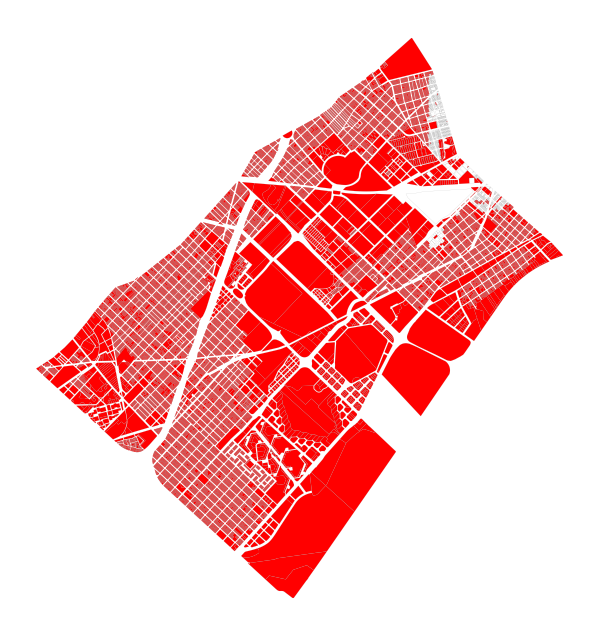

In [36]:
# Parcelas en rojo, no consultadas (en gris, consultadas)
plotnan(gdf=parcelas_sur, df=parcelas_xvars)

In [ ]:
#parcelas_xvars.to_csv('../data/expvar_parcelas_catastroapi.csv')